In [25]:
import pandas as pd   
import numpy as np    
import matplotlib.pyplot as plt 
%matplotlib inline
%config InlineBackend.figure_formats = ['retina']
import seaborn as sns
import time
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression,SGDClassifier
from sklearn.neighbors import KNeighborsClassifier, RadiusNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, brier_score_loss, fbeta_score
from sklearn.metrics import auc, roc_curve, roc_auc_score, precision_recall_curve
from PIL import  Image
import datetime
from scipy.stats import binom_test
import itertools
import plotly.offline as py#visualization
py.init_notebook_mode()#visualization

import plotly.graph_objs as go#visualization
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization

### Read | Merge | Examine Data

In [81]:
df1 = pd.read_csv('ml_case_test_data.csv')
df2 = pd.read_csv('ml_case_test_hist_data.csv')
df3 = pd.read_csv('ml_case_test_output_template.csv')
# #Merge df1 and df3
df1 = df1.merge(df3, on= 'id')
df2 = df2.groupby('id').mean()
df2.reset_index(inplace = True)
df1 = df1.merge(df2,on = 'id')
num_exp = df1.shape[0] #Record the num of line for calculating percentage loss of data after cleaning

In [82]:
def show_null_info(df1):
    '''
    show missing value percentage for a dataframe
    '''
    divsor = df1.shape[0]
    for i in df1.columns.to_list():
        num_null = len(df1[df1[i].isnull()])
        percentage = round(num_null*100/divsor,2)
        print('%s%% is null \t columns: %s'%(percentage,i))

def select_null_over_threshold(df1,threshold):
    '''
    select features whose missing value is above the threshold
    
    param:
        df1: dataframe
        threshold: features that has missing value above this threshold would be selected
    return:
        None
    '''
    drop_columns = []
    divsor = df1.shape[0]
    print('Select columns that have null value over %s%% of the data'%threshold)
    for i in df1.columns.to_list():
        num_null = len(df1[df1[i].isnull()])
        percentage = round(num_null*100/divsor,2)
        if percentage >threshold:
            print('%s%% percent is null   \t columns: %s'%(percentage,i))
            drop_columns.append(i)
    if not drop_columns:
        print('None')
    return


In [83]:
show_null_info(df1)
select_null_over_threshold(df1,30)

0.0% is null 	 columns: id
58.5% is null 	 columns: activity_new
100.0% is null 	 columns: campaign_disc_ele
26.24% is null 	 columns: channel_sales
0.0% is null 	 columns: cons_12m
0.0% is null 	 columns: cons_gas_12m
0.0% is null 	 columns: cons_last_month
0.0% is null 	 columns: date_activ
0.0% is null 	 columns: date_end
78.21% is null 	 columns: date_first_activ
1.12% is null 	 columns: date_modif_prod
0.1% is null 	 columns: date_renewal
78.21% is null 	 columns: forecast_base_bill_ele
78.21% is null 	 columns: forecast_base_bill_year
78.21% is null 	 columns: forecast_bill_12m
78.21% is null 	 columns: forecast_cons
0.0% is null 	 columns: forecast_cons_12m
0.0% is null 	 columns: forecast_cons_year
0.6% is null 	 columns: forecast_discount_energy
0.0% is null 	 columns: forecast_meter_rent_12m
0.6% is null 	 columns: forecast_price_energy_p1
0.6% is null 	 columns: forecast_price_energy_p2
0.6% is null 	 columns: forecast_price_pow_p1
0.0% is null 	 columns: has_gas
0.0% is nul

In [84]:
df1.columns.tolist()

['id',
 'activity_new',
 'campaign_disc_ele',
 'channel_sales',
 'cons_12m',
 'cons_gas_12m',
 'cons_last_month',
 'date_activ',
 'date_end',
 'date_first_activ',
 'date_modif_prod',
 'date_renewal',
 'forecast_base_bill_ele',
 'forecast_base_bill_year',
 'forecast_bill_12m',
 'forecast_cons',
 'forecast_cons_12m',
 'forecast_cons_year',
 'forecast_discount_energy',
 'forecast_meter_rent_12m',
 'forecast_price_energy_p1',
 'forecast_price_energy_p2',
 'forecast_price_pow_p1',
 'has_gas',
 'imp_cons',
 'margin_gross_pow_ele',
 'margin_net_pow_ele',
 'nb_prod_act',
 'net_margin',
 'num_years_antig',
 'origin_up',
 'pow_max',
 'Unnamed: 0',
 'Churn_prediction',
 'Churn_probability',
 'price_p1_var',
 'price_p2_var',
 'price_p3_var',
 'price_p1_fix',
 'price_p2_fix',
 'price_p3_fix']

In [85]:
df1.drop(columns = ['Unnamed: 0','Churn_prediction','Churn_probability'],axis =1,inplace = True)


### Feature Analysis(one by one)

ID：客户编号，没用

activity_new: 缺失值59%，有400多类，公司的活动， 可能有影响，one-hot encoding 处理， 缺失值变为No_activity

campaign_disc_ele: 上次参加的电力营销活动，对用户流失有影响。没参加和参加了，参加了什么营销活动应该都有影响. 但是100%缺失，舍弃

channel_sales: 销售渠道，重要，不同销售渠道的客户留存率可能会不一样. One-hot encoding 处理

cons_12m：过去12个月的电力消费。重要，因为背景是能源竞争开放，大订单的客户对价格会更敏感一些。

cons_gas_12m：过去12个月的天然气消费。重要，理由同上
cons_last_month: 上个月的电力消费，重要，理由同上。但是和前面cons_12m会有重合

date_activ: 和num_years_antig重合了，表示客户与我们交易多少年了

date_end:合同终止的日期，重要，合同快要到期的客户有更高的倾向流失//虽然画出图来没有啥相关性，但是可以提取具体的月份，计算字段：离现在还有几个月，然后离散化处理做EDA，也可以放进分类器中

date_first_activ:第一份合约的时间. 发现缺失值高达78%，而且非缺失的部分和date_activ的时间重合。是否说明，这个column 的含义是，我司是不是这位客户的第一个供应商。如果是这样，可能会影响是否留存。可以考虑将其做成categorical，分成是第一个供应商，和不是第一个供应商来考虑。

date_modif_prod: 最后对产品的更改，有影响，我理解为客户变更套餐可能会对流失产生影响。或许反映出了对现有套餐的价格或服务不满意？
可以做一个modif-activ 为x ， now-modif为y的一个散点图，探寻两者与churn的关系. 画一个坐标图。说明情况。感觉从来没有modi过的人留存率会高

date_renewal: -不太理解，是不是指合下一次同续签的时间，但是时间确发生在过去。暂时舍弃

forecast_base_bill_ele 和 forecast_base_bill_year和forecast_bill_12m: 前两个column的值完全一摸一样,并且和第三个变量的相关性达到近80%。而且三个变量都是一起出现 : 这三个分别表示下个月，这一年，以及未来12个月用户的账单预测。这个和留存有无关系还不好说。

一方面：公司作出的预测无法影响客户的决定。 用户不会因为你预测高或者低就决定走还是不走。

另一方面： 公司可能是基于客户的其他信息，作出的相对可靠的判断，是客户粘合度的一个反应。

还有：这几个有72%的缺失值，可能要做成有预测和没有与预测的dummy variable， 因为能够进行预测的客户可能会比无法进行预测的客户有更大的把握留存。

综合判断，查看一下相关性，不能全留。统计一下有预测和没有预测的留存率



forecast_cons 和 forecast_cons_12m 和 forecast_cons_year

这三个同理，第一个也有72%的损失。后两个是每一个用户都有预测，整体而言，预测的结果与流失率的关系都不大，只保留最后两个数据充足的预测，其余舍弃


forecast_discount_energy: 对单前折扣的估价-- 重要，如果当前折扣比较低的话，用户可能会更倾向于留存
no discount number 15391
no discount churn numebr 1481
no discount 0.09622506659736209
discount number 705
discount churn numer 114
discount 0.16170212765957448
有可能折扣之所以给的比较低，是因为其本来就想退出。Coursera 结束试用会给折扣。总之这个变量有点重要，可以考虑做一下t test 看看


forecast_meter_rent_12m: 另一个业务。租用电表的账单预测, 有负数的账单，考虑删除相应的行

和前几个预测同理，可以考虑加进来，虽然相关性不大，不过如果其租用我们电表的话账单很大的话，应该不容易溜走

forecast_price_energy_p1 和 forecast_price_energy_p2:

对两个period（不知道是哪两个）的能源价格预测（应该是市场价）这可能会影响用户留存？不知道用户知不知道这个消息，如果用户也知道，则会影响，如果用户不知道，则难说。因为不能因为我自己预估股价明天要涨，明天就会大量人买入吧。 考虑加入

forecast_price_pow_p1:对电力价格的预测，理由同上。需要更多的信息来判断 . 这些price 都有预测为0的，暂时不删掉，看看结果

has_gas:这个客户是不是也是天然气的客户 重要

imp_cons: 目前已经支付的消费。重要，这里面有负数，是不是说明其没有支付的欠款。如果客户迟迟不还，或者还的较多或者较少，应该会对留存造成影响。比如没有还的比较多，下次可能就不用我们的产品了（反映出客户的资金使用情况？）
但是负数的样本太少了，只有27个，如果真是这样，可能不具备学习的价值？--暂时先删除负数的样本

margin_gross_pow_ele: 当前这个客户公司的毛利

margin_net_pow_ele: 当前这个客户公司的净利润

这两个相关性挺高的，可能会对留存有影响，比如这个客户我没得赚，他会比较容易留下来？

nb_prod_act: 使用了我们多少产品和服务。 重要：

net_margin: total net margin: 不单是电力方面的，还有其他方面的net margin。 这个有点意思，他和前面的两个margin 相关性居然不大，有可能也会反应出是否流失客户这几个关于margin的变量，其中gross margin 和 net_margin似乎可以

num_years_antig: 重要，保留

origin_up : 第一次参加的电力营销活动，可能决定用户喜好？活跃？有可能印象，保留，one-hot encoding 处理

pow_max: 订阅的电源？保留 

### Data Cleaning

This Data Cleaning is the result after examing and exploring dataset many times. Therefore, it might be a bit confusing if you try to understand it for the first time. Because cleaning each feature need to examine its basic information, correlation with other variables and human insight (like handline negative value)

I omit the tedious process of showing how I cleaned data step by step for the consideration of the concision and simplicity of the code. Also,visualization can only be done after proper cleaning, otherwise it does not make sense. The reason that supports how I clean each feature is written in the above note in Chinese. I hope that can give more information of how I clean the data and why.

In [86]:
# Drop those features that are useless/highly correlated with others/Has too many missing value
df1.drop(columns = ['campaign_disc_ele','forecast_base_bill_ele','forecast_base_bill_year','forecast_bill_12m','forecast_cons','margin_net_pow_ele','date_renewal'],axis=1,inplace = True)

In [87]:
def months(str1,str2):
    '''
    Calculate different of months between two datetime strings
    '''
    year1 = datetime.datetime.strptime(str1[0:10],'%Y-%m-%d').year
    year2 = datetime.datetime.strptime(str2[0:10],'%Y-%m-%d').year
    month1 = datetime.datetime.strptime(str1[0:10],'%Y-%m-%d').month
    month2 = datetime.datetime.strptime(str2[0:10],'%Y-%m-%d').month
    num = (year1-year2)*12 + (month1-month2)
    return num

In [88]:
def feature_cross(df1,df2):
    '''
    Conduct feature cross operation between two dataframe
    
    param:
        df1,df2: dataframe only contains features that are need to be conducted feature cross
    return:
        df3: a new dataframe that contains feature cross feature
    '''
    col_name = 'FC'
    num1 = df1.shape[1]
    num2 = df2.shape[1]
    col1 = df1.columns.tolist()
    col2 = df2.columns.tolist()
    df3 = pd.DataFrame()
    for i in range(num1):
        for j in range(num2):
            df3[col1[i]+col2[j]] =df1[col1[i]]*df2[col2[j]] 
    return df3

In [89]:
def onehot(df,column):
    '''
    Conduct one-hot encoding for a column in a dataframe
    
    return:
        dataframe that already has one-hot encoding
    '''
    temp = pd.get_dummies(df1[column]).iloc[:,1:]
    return df.join(temp)

In [90]:
#处理时间变量，将其转换成datetime格式
df1 = df1.drop(df1[df1.date_end.isnull()].index)
df1.date_end = pd.to_datetime(df1.date_end)
df1.date_activ = pd.to_datetime(df1.date_activ)
df1.date_first_activ = pd.to_datetime(df1.date_first_activ)
df1.date_modif_prod = pd.to_datetime(df1.date_modif_prod)


#将date_end 中做字段转换，把合约到期距今截止有多少月份算出来作为一个新的变量
#理由：合约到期的时间越近，有可能对留存率有负面影响？
now = '2016-01-31'
df1.date_end = df1.date_end.apply(lambda x: months(str(x),now))
df1 = df1.drop(df1[df1.date_end<0].index)

#将其当作是是否为是客户第一家服务商的变量
df1.date_first_activ = df1.date_first_activ.fillna(0)
df1.date_first_activ=df1.date_first_activ.apply(lambda x: 1 if x !=0 else x)

#创建新的字段-产品留存时长
df1['current_retain_period']=(datetime.datetime.strptime(now,'%Y-%m-%d')-df1['date_modif_prod'])
df1.drop(df1[df1['current_retain_period'].isnull()].index,inplace = True)
df1.current_retain_period = df1.current_retain_period.apply(lambda x : round(x.days/30))

#创建新的字段- 历史留存时长
df1['hist_retain_period']=(df1['date_modif_prod']-df1['date_activ'])
df1.drop(df1[df1['hist_retain_period'].isnull()].index,inplace = True)
df1.hist_retain_period = df1.hist_retain_period.apply(lambda x : round(x.days/30))
df1.drop(df1[df1.hist_retain_period<0].index,inplace = True)

#其他变量的负值和missing value 处理
df1.activity_new = df1.activity_new.fillna('No_Activity')
df1.channel_sales = df1.channel_sales.fillna('Unkown_Channels')
df1.drop(df1[df1.forecast_meter_rent_12m<0].index,inplace = True)
df1.drop(df1[df1.forecast_price_energy_p1.isna()].index,inplace= True)
df1.drop(df1[df1.forecast_price_energy_p2.isna()].index,inplace= True)
df1.drop(df1[df1.forecast_price_pow_p1.isna()].index,inplace=True)
df1.drop(df1[df1.forecast_price_pow_p1<0].index,inplace=True)
df1.drop(df1[df1.imp_cons < 0].index,inplace = True)
df1.drop(df1[df1.cons_12m<0].index,inplace = True)
df1.drop(df1[df1.cons_gas_12m<0].index,inplace = True)
df1.drop(df1[df1.cons_last_month<0].index,inplace = True)
df1.drop(df1[df1.forecast_cons_12m<0].index,inplace = True)

#将has_gas 转换成0-1变量
df1.has_gas = df1.has_gas.map({'t':1,'f':0})

#将剩余变量的空值去除
df1.dropna(inplace = True)

In [91]:
print('after cleaning, ',round((1-df1.shape[0]/num_exp)*100,2),'% data were lost')

after cleaning,  3.08 % data were lost


### Expolratory Data Analysis

First,Divide some numercial feature into several categories in order to explore it's relationship with churning

In [23]:
#Discretize number of years
def antig_lab(df) :
    
    if df["num_years_antig"] <= 3 :
        return "years_0-3"
    elif (df["num_years_antig"] > 3) & (df["num_years_antig"] <= 5 ):
        return "years_3-5"
    elif (df["num_years_antig"] > 5) & (df["num_years_antig"] <= 8) :
        return "years_5-8"
    elif (df["num_years_antig"] > 8) & (df["num_years_antig"] <= 12) :
        return "years_8-12"
    elif df["num_years_antig"] > 12 :
        return "yeras_gt_12"
    
#Discretize date_end features 
def date_end_lab(df) :
    
    if df["date_end"] <= 1 :
        return "contract_end<1 month"
    elif (df["date_end"] > 1) & (df["date_end"] <= 3 ):
        return "contract_end 1-3 month"
    elif (df["date_end"] > 3) & (df["date_end"] <= 6) :
        return "contract_end 3-6 month"
    elif (df["date_end"] > 6) & (df["date_end"] <= 12) :
        return "contract_end 6-12 month"
    elif df["date_end"] > 12 :
        return "contract_end>12 month"
#Discretize current discount features
def discount_lab(df) :
    
    if df["forecast_discount_energy"] <= 0 :
        return "No discount"

    elif df["forecast_discount_energy"] > 0 :
        return "with_discount"
    
df1["years_antig_group"] = df1.apply(lambda df:antig_lab(df),
                                      axis = 1)

df1["date_end_group"] = df1.apply(lambda df:date_end_lab(df),
                                      axis = 1)

df1["discount_group"] = df1.apply(lambda df:discount_lab(df),
                                      axis = 1)

Divide dataframe into churn group and not_churn group

In [24]:
churn     = df1[df1["churn"] == 1]
not_churn = df1[df1['churn'] == 0]

KeyError: 'churn'

In [79]:
#Defined different types of columns to explore relationship
target_col = ["churn"]
cat_cols   = ['has_gas','discount_group','date_first_activ','origin_up','channel_sales','years_antig_group','date_end_group']
num_cols   = ['cons_12m','cons_gas_12m','margin_gross_pow_ele','imp_cons']

#### Churn rate overview

In [80]:
#labels
lab = df1["churn"].value_counts().keys().tolist()
#values
val = df1["churn"].value_counts().values.tolist()

trace = go.Pie(labels = ['no churn','churn'] ,
               values = val ,
               marker = dict(colors =  [ 'royalblue' ,'lime'],
                             line = dict(color = "White",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Customer Churn in data",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data,layout = layout)
py.iplot(fig)

In [81]:
#function  for pie plot for customer attrition types
def plot_pie(column) :
    
    trace1 = go.Pie(values  = churn[column].value_counts().values.tolist(),
                    labels  = churn[column].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    domain  = dict(x = [0,.48]),
                    name    = "Churn Customers",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    hole    = .6
                   )
    trace2 = go.Pie(values  = not_churn[column].value_counts().values.tolist(),
                    labels  = not_churn[column].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    domain  = dict(x = [.52,1]),
                    hole    = .6,
                    name    = "Non churn customers" 
                   )


    layout = go.Layout(dict(title = column + " distribution in customer churn ",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            annotations = [dict(text = "churn customers",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .15, y = .5),
                                           dict(text = "Non churn customers",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .88,y = .5
                                               )
                                          ]
                           )
                      )
    data = [trace1,trace2]
    fig  = go.Figure(data = data,layout = layout)
    py.iplot(fig)

#for all categorical columns plot pie
for i in cat_cols :
    plot_pie(i)

In [216]:
#function  for scatter plot matrix  for numerical columns in data
def scatter_matrix(df)  :
    
    df  = df.sort_values(by = "churn" ,ascending = True)
    classes = df["churn"].unique().tolist()
    
    
    class_code  = {classes[k] : k for k in range(2)}
    

    color_vals = [class_code[cl] for cl in df["churn"]]
    

    pl_colorscale = "Portland"



    text = [df.loc[k,"churn"] for k in range(len(df))]
    
#cons_12m','cons_gas_12m','margin_gross_pow_ele','imp_cons
    trace = go.Splom(dimensions = [dict(label  = "pow_max",
                                       values = df["pow_max"]),
                                    dict(label  = "cons_12m",
                                       values = df["cons_12m"]),
                                  dict(label  = 'cons_gas_12m',
                                       values = df['cons_gas_12m']),
                                  dict(label  = 'hist_retain',
                                       values = df['hist_retain_period']),
                                   dict(label  = 'current_retain',
                                       values = df['current_retain_period']),
                                  dict(label  = 'margin_gross-ele',
                                       values = df['margin_gross_pow_ele'])],
                     text = text,
                     showupperhalf=True,
                     marker = dict(color = color_vals,
                                   colorscale = pl_colorscale,
                                   size = 3,
                                   showscale = True,
                                   line = dict(width = .1,
                                               color='rgb(230,230,230)'
                                              )
                                  )
                    )
    axis = dict(showline  = True,
                zeroline  = False,
                gridcolor = "#fff",
                ticklen   = 4
               )
    
    layout = go.Layout(dict(title  = 
                            "Scatter plot matrix for Numerical columns for customer attrition",
                            autosize = False,
                            height = 800,
                            width  = 800,
                            dragmode = "select",
                            hovermode = "closest",
                            plot_bgcolor  = 'rgba(240,240,240, 0.95)',
                            xaxis1 = dict(axis),
                            yaxis1 = dict(axis),
                            xaxis2 = dict(axis),
                            yaxis2 = dict(axis),
                            xaxis3 = dict(axis),
                            yaxis3 = dict(axis),
                           )
                      )
    data   = [trace]
    fig = go.Figure(data = data,layout = layout )
    py.iplot(fig)
#scatter plot matrix



In [83]:
df1.churn = df1.churn.map({1:'Yes',0:'No'})
df1.reset_index(inplace = True)
df2 =df1[['churn','pow_max','cons_12m','cons_gas_12m','margin_gross_pow_ele','imp_cons','hist_retain_period','current_retain_period']]
scatter_matrix(df2)

In [84]:
#cusomer attrition in tenure groups
tg_ch  =  churn["years_antig_group"].value_counts().reset_index()
tg_ch.columns  = ["years_antig_group","count"]
tg_nch =  not_churn["years_antig_group"].value_counts().reset_index()
tg_nch.columns = ["years_antig_group","count"]

#bar - churn
trace1 = go.Bar(x = tg_ch["years_antig_group"]  , y = 100*tg_ch['count']/(tg_ch['count']+tg_nch['count']),
                name = "Churn Customers",
                marker = dict(line = dict(width = .5,color = "black")),
                opacity = .9)

layout = go.Layout(dict(title = "Customer attrition in num_years groups",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "tenure group",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "count",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                       )
                  )
data = [trace1]
fig  = go.Figure(data=data,layout=layout)
py.iplot(fig)

In [85]:
df1[['cons_12m', 'margin_gross_pow_ele','churn',"years_antig_group"]]

#scatter plot monthly charges & total charges by tenure group

def plot_tenure_scatter(tenure_group,color) :
    tracer = go.Scatter(x = df1[df1["years_antig_group"] == tenure_group]["cons_12m"],
                        y = df1[df1["years_antig_group"] == tenure_group]["margin_gross_pow_ele"],
                        mode = "markers",marker = dict(line = dict(color = "black",
                                                                   width = .2),
                                                       size = 4 , color = color,
                                                       symbol = "diamond-dot",
                                                      ),
                        name = tenure_group,
                        opacity = .9
                       )
    return tracer

#scatter plot monthly charges & total charges by churn group
def plot_churncharges_scatter(churn,color) :
    tracer = go.Scatter(x = df1[df1["churn"] == churn]["cons_12m"],
                        y = df1[df1["churn"] == churn]["margin_gross_pow_ele"],
                        mode = "markers",marker = dict(line = dict(color = "black",
                                                                   width = .2),
                                                       size = 4 , color = color,
                                                       symbol = "diamond-dot",
                                                      ),
                        name = "Churn - " + churn,
                        opacity = .9
                       )
    return tracer

trace1 = plot_tenure_scatter("years_0-3","#FF3300")
trace2 = plot_tenure_scatter("years_3-5","#6666FF")
trace3 = plot_tenure_scatter("years_5-8","#99FF00")
trace4 = plot_tenure_scatter("years_8-12","#996600")
trace5 = plot_tenure_scatter("years_gt_12","grey")
trace6 = plot_churncharges_scatter("Yes","red")
trace7 = plot_churncharges_scatter("No","blue")

data1   = [trace1,trace2,trace3,trace4,trace5] 
data2   = [trace7,trace6]

#layout
def layout_title(title) :
    layout = go.Layout(dict(title = title,
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                         title = "Monthly charges",
                                         zerolinewidth=1,ticklen=5,gridwidth=2),
                            yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                         title = "Total Charges",
                                         zerolinewidth=1,ticklen=5,gridwidth=2),
                            height = 600
                           )
                      )
    return layout

layout1  = layout_title("Monthly Charges & Total Charges by Tenure group")
layout2  = layout_title("Monthly Charges & Total Charges by Churn group")
fig1 = go.Figure(data = data1,layout = layout1)
fig2 = go.Figure(data = data2,layout = layout2)
py.iplot(fig1)
py.iplot(fig2)

In [86]:

trace1 = go.Scatter3d(x = churn["cons_12m"],
                      y = churn["margin_gross_pow_ele"],
                      z = churn["num_years_antig"],
                      mode = "markers",
                      name = "Churn customers",
#                       text = "Id : " + int(churn.index),
                      marker = dict(size = 1,color = "red")
                     )
trace2 = go.Scatter3d(x = not_churn["cons_12m"],
                      y = not_churn["margin_gross_pow_ele"],
                      z = not_churn["num_years_antig"],
                      name = "Non churn customers",
#                       text = "Id : " + int(not_churn.index),
                      mode = "markers",
                      marker = dict(size = 1,color= "green")
                     )



layout = go.Layout(dict(title = "Monthly charges,total charges & tenure in customer attrition",
                        scene = dict(camera = dict(up=dict(x= 0 , y=0, z=0),
                                                   center=dict(x=0, y=0, z=0),
                                                   eye=dict(x=1.25, y=1.25, z=1.25)),
                                     xaxis  = dict(title = "monthly charges",
                                                   gridcolor='rgb(255, 255, 255)',
                                                   zerolinecolor='rgb(255, 255, 255)',
                                                   showbackground=True,
                                                   backgroundcolor='rgb(230, 230,230)'),
                                     yaxis  = dict(title = "total charges",
                                                   gridcolor='rgb(255, 255, 255)',
                                                   zerolinecolor='rgb(255, 255, 255)',
                                                   showbackground=True,
                                                   backgroundcolor='rgb(230, 230,230)'
                                                  ),
                                     zaxis  = dict(title = "tenure",
                                                   gridcolor='rgb(255, 255, 255)',
                                                   zerolinecolor='rgb(255, 255, 255)',
                                                   showbackground=True,
                                                   backgroundcolor='rgb(230, 230,230)'
                                                  )
                                    ),
                        height = 700,
                       )
                  )
                  

data = [trace1,trace2]
fig  = go.Figure(data = data,layout = layout)
py.iplot(fig)


### Data Preprocessing For Machine Learning

In [92]:
df1.head()

,id,activity_new,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_first_activ,date_modif_prod,...,origin_up,pow_max,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix,current_retain_period,hist_retain_period
0,ed18c9981ce183ef347246cdcc55f743,bwpaswkpcilmlklklcapcwwumwaodaoo,foosdfpfkusacimwkcsosbicdxkicaua,42132,0,3215,2011-09-06,8,0,2015-08-27,...,lxidpiddsbxsbosboudacockeimpuepw,20.000,0.123993,0.103568,0.073708,40.728885,24.437330,16.291555,5,48
1,9c341e73685fcff6e3527ebd51da3fe5,No_Activity,foosdfpfkusacimwkcsosbicdxkicaua,3537,0,563,2010-12-13,11,0,2010-12-13,...,lxidpiddsbxsbosboudacockeimpuepw,15.000,0.146223,0.000000,0.000000,44.444710,0.000000,0.000000,62,0
2,97dd64b33716aadc4e22c4ab85d1c7a4,No_Activity,foosdfpfkusacimwkcsosbicdxkicaua,6543,0,399,2010-09-04,8,0,2015-08-27,...,lxidpiddsbxsbosboudacockeimpuepw,17.321,0.125124,0.104431,0.074728,40.606699,24.364017,16.242678,5,61
3,cf81de72ff7997ed10729751059cf7a3,apdekpcbwosbxepsfxclislboipuxpop,foosdfpfkusacimwkcsosbicdxkicaua,186838,0,12091,2011-01-03,12,0,2011-01-03,...,lxidpiddsbxsbosboudacockeimpuepw,11.951,0.168048,0.086593,0.000000,44.266930,0.000000,0.000000,62,0
4,c7c8ee9daf2a864d159d45a2373ada72,No_Activity,usilxuppasemubllopkaafesmlibmsdf,19051,0,0,2011-10-07,9,0,2015-08-27,...,lxidpiddsbxsbosboudacockeimpuepw,13.150,0.147351,0.000000,0.000000,44.326190,0.000000,0.000000,5,47


In [94]:
# Setting parameters for different modes
predict_mode = True
feature_cross_setting = False            #Whether to inlucde feature cross
stacking = False                         #Whether apply stacking method 
scoring = 'brier_score_loss'                           #Scoring method for CV    Other options: 'f1','roc_auc'
weighting = None                       #Whether use class_weight in sklearn. Alternative is 'balanced'
oversample  = False                           #Wheter to use SMOTE oversample (slow down training)  


df = df1.copy()
df.drop(columns = ['id','date_modif_prod','date_activ'],inplace = True)

In [95]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

#Target columns
target_col = ["churn"]
#categorical columns
cat_cols   = df.nunique()[df.nunique() < 10].keys().tolist()
cat_cols   = [x for x in cat_cols if x not in target_col]+['activity_new']
#numerical columns
num_cols   = [x for x in df.columns if x not in cat_cols + target_col]
#Binary columns with 2 values
bin_cols   = df.nunique()[df.nunique() == 2].keys().tolist()
#Columns more than 2 values
multi_cols = [i for i in cat_cols if i not in bin_cols]

#Label encoding Binary columns
le = LabelEncoder()
for i in bin_cols :
    df[i] = le.fit_transform(df[i])
    
#Duplicating columns for multi value columns
if feature_cross_setting == True:
    for i in multi_cols:
        if i =='activity_new':
            df = onehot(df,i)

    temp1 =pd.get_dummies(df['channel_sales'])
    temp2 =pd.get_dummies(df['origin_up'])
    df= df.join(feature_cross(temp1,temp2).iloc[:,1:])
else:
    for i in multi_cols:
        df=onehot(df,i)
# #Scaling Numerical columns
# std = StandardScaler()
# scaled = std.fit_transform(df[num_cols])
# scaled = pd.DataFrame(scaled,columns=num_cols)

#dropping original values merging scaled values for numerical columns
df = df.drop(columns = multi_cols,axis = 1)
# df = df.drop(columns = num_cols,axis = 1)
# df = df.merge(scaled,left_index=True,right_index=True,how = "left")

In [97]:
df1.head()

,id,activity_new,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_first_activ,date_modif_prod,...,origin_up,pow_max,price_p1_var,price_p2_var,price_p3_var,price_p1_fix,price_p2_fix,price_p3_fix,current_retain_period,hist_retain_period
0,ed18c9981ce183ef347246cdcc55f743,bwpaswkpcilmlklklcapcwwumwaodaoo,foosdfpfkusacimwkcsosbicdxkicaua,42132,0,3215,2011-09-06,8,0,2015-08-27,...,lxidpiddsbxsbosboudacockeimpuepw,20.000,0.123993,0.103568,0.073708,40.728885,24.437330,16.291555,5,48
1,9c341e73685fcff6e3527ebd51da3fe5,No_Activity,foosdfpfkusacimwkcsosbicdxkicaua,3537,0,563,2010-12-13,11,0,2010-12-13,...,lxidpiddsbxsbosboudacockeimpuepw,15.000,0.146223,0.000000,0.000000,44.444710,0.000000,0.000000,62,0
2,97dd64b33716aadc4e22c4ab85d1c7a4,No_Activity,foosdfpfkusacimwkcsosbicdxkicaua,6543,0,399,2010-09-04,8,0,2015-08-27,...,lxidpiddsbxsbosboudacockeimpuepw,17.321,0.125124,0.104431,0.074728,40.606699,24.364017,16.242678,5,61
3,cf81de72ff7997ed10729751059cf7a3,apdekpcbwosbxepsfxclislboipuxpop,foosdfpfkusacimwkcsosbicdxkicaua,186838,0,12091,2011-01-03,12,0,2011-01-03,...,lxidpiddsbxsbosboudacockeimpuepw,11.951,0.168048,0.086593,0.000000,44.266930,0.000000,0.000000,62,0
4,c7c8ee9daf2a864d159d45a2373ada72,No_Activity,usilxuppasemubllopkaafesmlibmsdf,19051,0,0,2011-10-07,9,0,2015-08-27,...,lxidpiddsbxsbosboudacockeimpuepw,13.150,0.147351,0.000000,0.000000,44.326190,0.000000,0.000000,5,47


In [98]:
df['id'] = df1.id
df['Churn_prediction']=0
df['Churn_probability']=0

In [99]:
df.head()

,cons_12m,cons_gas_12m,cons_last_month,date_end,date_first_activ,forecast_cons_12m,forecast_cons_year,forecast_meter_rent_12m,forecast_price_energy_p1,forecast_price_energy_p2,...,xlwlakkoiebpwueucmdpsslcfiaxeuec,xmwbumaacodddfxueeocfiucawccblxe,xpmaxkfbpsbuliopadcpsolcbdboopbf,xuebxddpsuiwcoubouucmwblddafkmec,xufxifdsuplwioblexsdedieaowlkcox,xwpmxlfwakscmxoiipbcckoabfouxebx,xwwsfoileuxkwbcxupadudcfoecmmdda,id,Churn_prediction,Churn_probability
0,42132,0,3215,8,0,4001.08,3215,130.43,0.114603,0.098261,...,0,0,0,0,0,0,0,ed18c9981ce183ef347246cdcc55f743,0,0
1,3537,0,563,11,0,518.22,563,23.20,0.142174,0.000000,...,0,0,0,0,0,0,0,9c341e73685fcff6e3527ebd51da3fe5,0,0
2,6543,0,399,8,0,639.65,399,130.32,0.115182,0.098841,...,0,0,0,0,0,0,0,97dd64b33716aadc4e22c4ab85d1c7a4,0,0
3,186838,0,12091,12,0,2634.23,738,16.42,0.164058,0.086163,...,0,0,0,0,0,0,0,cf81de72ff7997ed10729751059cf7a3,0,0
4,19051,0,0,9,0,2801.47,0,0.00,0.141434,0.000000,...,0,0,0,0,0,0,0,c7c8ee9daf2a864d159d45a2373ada72,0,0


In [100]:
df.to_csv('clean_test.csv')

## Principal Component Analysis

#### Two Dimensions

In [23]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 2)

X = df[[i for i in df.columns if i not in target_col]]
Y = df[target_col]

principal_components = pca.fit_transform(X)
pca_data = pd.DataFrame(principal_components,columns = ["PC1","PC2"])
pca_data = pca_data.merge(Y,left_index=True,right_index=True,how="left")
pca_data["churn"] = pca_data["churn"].replace({1:"Churn",0:"Not Churn"})

def pca_scatter(target,color) :
    tracer = go.Scatter(x = pca_data[pca_data["churn"] == target]["PC1"] ,
                        y = pca_data[pca_data["churn"] == target]["PC2"],
                        name = target,mode = "markers",
                        marker = dict(color = color,
                                      line = dict(width = .5),
                                      symbol =  "diamond-open")
                       )
    return tracer

layout = go.Layout(dict(title = "Visualising data with principal components",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "principal component 1",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "principal component 2",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        height = 600
                       )
                  )
trace1 = pca_scatter("Churn",'red')
trace2 = pca_scatter("Not Churn",'royalblue')
data = [trace2,trace1]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

#### Three Dimensions

In [150]:

pca = PCA(n_components = 3)
principal_components = pca.fit_transform(X)
pca_data = pd.DataFrame(principal_components,columns = ["PC1","PC2","PC3"])
pca_data = pca_data.merge(Y,left_index=True,right_index=True,how="left")
pca_data["churn"] = pca_data["churn"].replace({1:"Churn",0:"Not Churn"})

trace1 = go.Scatter3d(x = pca_data[pca_data["churn"] == "Churn"]["PC1"],
                      y = pca_data[pca_data["churn"] == "Churn"]["PC2"],
                      z = pca_data[pca_data["churn"] == "Churn"]["PC3"],
                      mode = "markers",
                      name = "Churn customers",
#                       text = "Id : " + int(churn.index),
                      marker = dict(size = 1,color = "red")
                     )
trace2 = go.Scatter3d(x = pca_data[pca_data["churn"] == "Not Churn"]["PC1"],
                      y = pca_data[pca_data["churn"] == "Not Churn"]["PC2"],
                      z = pca_data[pca_data["churn"] == "Not Churn"]["PC3"],
                      name = "Non churn customers",
#                       text = "Id : " + int(not_churn.index),
                      mode = "markers",
                      marker = dict(size = 1,color= "green")
                     )



layout = go.Layout(dict(title = "Monthly charges,total charges & tenure in customer attrition",
                        scene = dict(camera = dict(up=dict(x= 0 , y=0, z=0),
                                                   center=dict(x=0, y=0, z=0),
                                                   eye=dict(x=1.25, y=1.25, z=1.25)),
                                     xaxis  = dict(title = "PC1",
                                                   gridcolor='rgb(255, 255, 255)',
                                                   zerolinecolor='rgb(255, 255, 255)',
                                                   showbackground=True,
                                                   backgroundcolor='rgb(230, 230,230)'),
                                     yaxis  = dict(title = "PC2",
                                                   gridcolor='rgb(255, 255, 255)',
                                                   zerolinecolor='rgb(255, 255, 255)',
                                                   showbackground=True,
                                                   backgroundcolor='rgb(230, 230,230)'
                                                  ),
                                     zaxis  = dict(title = "PC3",
                                                   gridcolor='rgb(255, 255, 255)',
                                                   zerolinecolor='rgb(255, 255, 255)',
                                                   showbackground=True,
                                                   backgroundcolor='rgb(230, 230,230)'
                                                  )
                                    ),
                        height = 700,
                       )
                  )
                  

data = [trace1,trace2]
fig  = go.Figure(data = data,layout = layout)
py.iplot(fig)


https://www.youtube.com/watch?v=FheTDyCwRdE

https://www.youtube.com/watch?v=I-sMbGFNAUM

### Feature Selection with RandomForest 

Text(0.5,1,'Top Features derived by Random Forest')

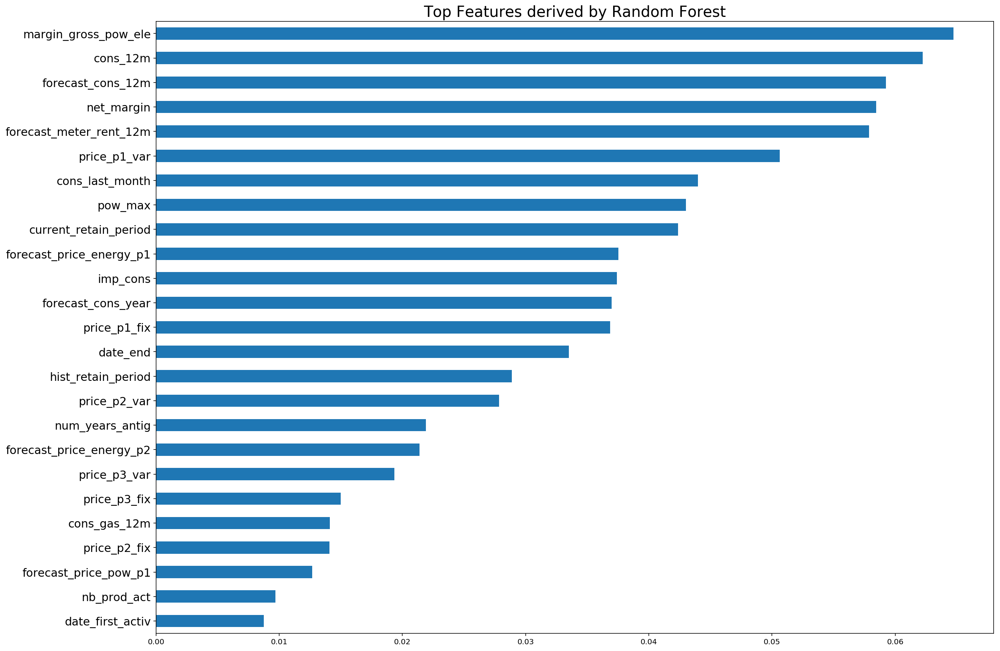

In [317]:
from sklearn.ensemble import RandomForestClassifier
## To look for top features using Random Forest
# Create decision tree classifer object
cols    = [i for i in df.columns if i not in target_col]
X=df[cols]
y=df['churn']

rfc = RandomForestClassifier(random_state=0, n_estimators=100)

# Train model, note that NO scaling is required
model = rfc.fit(X, y)

# Plot the top features based on its importance
(pd.Series(model.feature_importances_, index=X.columns)
   .nlargest(25)   # can adjust based on how many top features you want
   .plot(kind='barh', figsize=[20,15])
    .invert_yaxis()) # Ensures that the feature with the most importance is on top, in descending order

columns_select = pd.Series(model.feature_importances_,index = X.columns).nlargest(25).index
plt.yticks(size=15)
plt.title('Top Features derived by Random Forest', size=20)

In [318]:
#Choosing 25 features to train the model
cols = columns_select
df =df[cols]

bin_cols   = df.nunique()[df.nunique() == 2].keys().tolist()
num_cols = [i for i in df.columns if i not in target_col+bin_cols]
df['churn']=y

### Train Test Split
Only scale X_train and transform to X_test and X_True_Test(if stacking == True)


In [319]:
def scaling(df_train,df_test,num_cols):
    std = StandardScaler()
    std.fit(df_train[num_cols])
    
    scaled = std.transform(df_train[num_cols])
    scaled_test = std.transform(df_test[num_cols])
    
    scaled = pd.DataFrame(scaled,columns=num_cols)
    scaled_test = pd.DataFrame(scaled_test,columns=num_cols)
    
    df_train = df_train.reset_index().drop(columns= 'index')
    df_train = df_train.drop(columns = num_cols,axis = 1)

    df_train = df_train.merge(scaled,left_index=True,right_index=True,how = "left")
    
    df_test = df_test.reset_index().drop(columns= 'index')
    df_test = df_test.drop(columns = num_cols,axis = 1)
    df_test = df_test.merge(scaled_test,left_index=True,right_index=True,how = "left")
    return df_train,df_test

In [320]:
if stacking == True:
    if predict_mode == True:
        
        X_True_Test = 
        Y_True_Test =
    df_test = df.sample(frac= 0.1,random_state=100)
    df.drop(df_test.index,axis = 0,inplace = True)
    df=df.reset_index().drop(columns= 'index')

    df_test = df_test.reset_index().drop(columns = 'index')

    X_True_Test = df_test[cols]
    Y_True_Test = df_test[target_col]
    Y_True_Test_input = Y_True_Test.copy()

In [321]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE



def split_dataset(df, cols, target_col,num_cols, oversample):
    global X_True_Test,stacking
    X = df[cols]
    Y = df[target_col]
    if oversample==True:
        

        #Split train and test data
        smote_train_X,smote_test_X,smote_train_Y,smote_test_Y = train_test_split(X,Y,
                                                                                 test_size = 0.2 ,
                                                                                 random_state = 111)
        smote_train_X_copy = smote_train_X.copy()
        smote_train_X,smote_test_X = scaling(smote_train_X,smote_test_X,num_cols)
        if stacking == True:
            _,X_True_Test = scaling(smote_train_X_copy,X_True_Test,num_cols)
        #oversampling minority class using smote
        os = SMOTE(random_state = 0)
        os_smote_X,os_smote_Y = os.fit_sample(smote_train_X,smote_train_Y)
        X = pd.DataFrame(data = os_smote_X,columns=smote_test_X.columns)
        Y = pd.DataFrame(data = os_smote_Y,columns=target_col)
        return X,smote_test_X,Y,smote_test_Y
    
    else:
        X_train,X_test,Y_train,Y_test = train_test_split(X,Y,
                                                         test_size = 0.2 ,
                                                         random_state = 111)
        X_train_copy = X_train.copy()
        
        X_train,X_test = scaling(X_train,X_test,num_cols)
        if stacking == True:
            _,X_True_Test =  scaling(X_train_copy,X_True_Test,num_cols)
        return X_train,X_test,Y_train,Y_test 
    



X_train,X_test,y_train,y_test = split_dataset(df,cols,target_col,num_cols,oversample)
if stacking == True:
    y_test_input = y_test.copy()

https://towardsdatascience.com/feature-selection-using-random-forest-26d7b747597f

https://imbalanced-learn.readthedocs.io/en/stable/generated/imblearn.over_sampling.SMOTE.html#r001eabbe5dd7-1

https://stackoverflow.com/questions/56308116/should-feature-selection-be-done-before-train-test-split-or-after

https://machinelearningmastery.com/how-to-score-probability-predictions-in-python/

https://stats.stackexchange.com/questions/163221/whats-the-measure-to-assess-the-binary-classification-accuracy-for-imbalanced-d

## Optimization
The problem can be stated as the following:


><i>Find a <b>recall rate and precision rate<b>, maximaize expected total Revenue<i>

<img src="1st_math.png">
<img src="2nd_math.png">
<img src="3rd_math.png">

Hence, I construct a defined score = $(1-\frac{D}{\beta})\alpha$
and use searching algorithm to find the threshold that maximaize it

### Define model report

In [322]:
def model_report(model_name, model):
    print('\nSearch for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data')
    model.fit(X_train, y_train)
    optimal_th = 0.5   # start with default threshold value
    
    for i in range(0,3):
        score_list = []
        f1_score_list = []
        print('\nLooping decimal place', i+1) 
        th_list = [np.linspace(optimal_th-0.4999, optimal_th+0.4999, 11), 
                  # eg [ 0.0001 , 0.1008, 0.2006, 0.3004, 0.4002, 0.5, 0.5998, 0.6996, 0.7994, 0.8992, 0.9999 ]
                 np.linspace(optimal_th-0.1, optimal_th+0.1, 21), 
                  # eg 0.3xx [ 0.2 , 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 ]
                 np.linspace(optimal_th-0.01, optimal_th+0.01, 21)]
                  # eg 0.30x [ 0.29 , 0.291, 0.292, 0.293, 0.294, 0.295, 0.296, 0.297, 0.298, 0.299, 0.3  , 0.301, 0.302, 0.303, 0.304, 0.305, 0.306, 0.307, 0.308, 0.309, 0.31 ]
        for th in th_list[i]:
            y_pred = (model.predict_proba(X_test)[:,1] >= th)
            P =  precision_score(y_test, y_pred)
            R = recall_score(y_test, y_pred)
            scor =(1-0.2/P)*R
            score_list.append(scor)
            F_score = f1_score(y_test, y_pred)
            f1_score_list.append(F_score)
            print('{:.3f}->{:.4f}'.format(th, scor), end=',  ')   # display score in 4 decimal pl
        optimal_th = float(th_list[i][score_list.index(max(score_list))])
        optimal_th_f1 = float(th_list[i][f1_score_list.index(max(f1_score_list))])
    print('')
    print('optimal Defined score = {:.4f}'.format(max(score_list)))
    print('optimal threshold = {:.3f}'.format(optimal_th))

    print('optimal F1 score = {:.4f}'.format(max(f1_score_list)))
    print('optimal threshold_f1 = {:.3f}'.format(optimal_th_f1))
    
    print(model_name, 'accuracy score is')
    print('Training: {:.2f}%'.format(100*model.score(X_train, y_train)))  # score uses accuracy
    print('Test set: {:.2f}%'.format(100*model.score(X_test, y_test)))   # should use cross validation

#     y_pred = (model.predict_proba(X_test)[:,1] >= 0.25)
#     print('\nAdjust threshold to 0.25:')
#     print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f}'.format(
#         precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred)))
#     print(model_name, 'confusion matrix: \n', confusion_matrix(y_test, y_pred))

#     y_pred = model.predict(X_test)
#     print('\nDefault threshold of 0.50:')
#     print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f}'.format(
#         precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred)))
#     print(model_name, 'confusion matrix: \n', confusion_matrix(y_test, y_pred))

#     y_pred = (model.predict_proba(X_test)[:,1] >= 0.75)
#     print('\nAdjust threshold to 0.75:')
#     print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f}'.format(
#         precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred)))
#     print(model_name, 'confusion matrix: \n', confusion_matrix(y_test, y_pred))

    y_pred = (model.predict_proba(X_test)[:,1] >= optimal_th)
    print('\nOptimal threshold(defined) {:.3f}'.format(optimal_th))
    print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f}, Defined Score: {:.4f}'.format(
        precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred),(1-0.2/precision_score(y_test,y_pred))*recall_score(y_test,y_pred)))
    print(model_name, 'confusion matrix: \n', confusion_matrix(y_test, y_pred))
    
    y_pred = (model.predict_proba(X_test)[:,1] >= optimal_th_f1)
    print('\nOptimal threshold(F1) {:.3f}'.format(optimal_th_f1))
    print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f}, Defined Score: {:.4f}'.format(
        precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred),(1-0.2/precision_score(y_test,y_pred))*recall_score(y_test,y_pred)))
    print(model_name, 'confusion matrix: \n', confusion_matrix(y_test, y_pred))
    
    global model_f1, model_auc, model_ll, model_roc_auc, model_auc2,defined_s,stacking
    model_f1 = f1_score(y_test, y_pred)
    defined_s = max(score_list)
    y_pred = model.predict_proba(X_test)
    if stacking == True:
        y_pred_true = model.predict_proba(X_True_Test)

        prob1 = np.array(y_pred)
        prob2 = np.array(y_pred_true)

        Y_True_Test_input[model_name] =prob2[:,1] 
        y_test_input[model_name]=prob1[:,1]
    model_ll = brier_score_loss(y_test, y_pred[:,1])
    print(model_name, 'brier_score_loss: {:.4f}'.format(model_ll))
    y_pred = model.predict(X_test)
    model_roc_auc = roc_auc_score(y_test, y_pred)
    print(model_name, 'roc_auc_score: {:.4f}'.format(model_roc_auc)) 
    y_pred = model.predict_proba(X_test)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    precision, recall, _ = precision_recall_curve(y_test, y_pred)
    model_auc = auc(fpr, tpr)
    model_auc2 = auc(recall, precision)
    print(model_name, 'Precision_recall_AUC: {:.4f}'.format(model_auc2))
    print(model_name, 'AUC: {:.4f}'.format(model_auc))
    print(model_name, 'Optimal Defined score {:.4f}'.format(defined_s))
    print(model_name, 'Optimal F1 score {:.4f}'.format(model_f1))

    # plot the ROC curve
    plt.figure(figsize = [6,6])
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % model_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    # plt.savefig('roc_auc_score')
    plt.draw()
    
    plt.figure(figsize = [6,6])
    
    plt.plot(precision,recall, label = 'P-R curve (area = %0.2f)'%model_auc2)
    plt.plot([0, 1], [1, 0],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('recall Rate')
    plt.ylabel('precision Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower left")
    plt.draw()
    
    plt.show()
    return

# initialise lists to collect the results to plot later
model_list = []
f1_list = []
auc_list = []
ll_list = []
roc_auc_list = []
pr_auc_list = []
defined_score = []
time_list = []

## Naive Bayes (GaussianNB & BernoulliNB)


"""""" GaussianNB """"""

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data

Looping decimal place 1
0.000->-0.9373,  0.100->-0.8733,  0.200->-0.8580,  0.300->-0.8620,  0.400->-0.8573,  0.500->-0.8560,  0.600->-0.8547,  0.700->-0.8520,  0.800->-0.8347,  0.900->-0.7933,  1.000->-0.0040,  
Looping decimal place 2
0.900->-0.7933,  0.910->-0.7813,  0.920->-0.7740,  0.930->-0.7627,  0.940->-0.7460,  0.950->-0.7200,  0.960->-0.7007,  0.970->-0.6340,  0.980->-0.4267,  0.990->-0.2133,  1.000->-0.0040,  1.010->nan,  1.020->nan,  1.030->nan,  1.040->nan,  1.050->nan,  1.060->nan,  1.070->nan,  1.080->nan,  1.090->nan,  1.100->nan,  
Looping decimal place 3
0.990->-0.2133,  0.991->-0.1953,  0.992->-0.1793,  0.993->-0.1673,  0.994->-0.1460,  0.995->-0.1160,  0.996->-0.0940,  0.997->-0.0640,  0.998->-0.0440,  0.999->-0.0040,  1.000->-0.0040,  1.001->nan,  1.002->nan,  1.003->nan,  1.004->nan,  1.005->nan,  1.006->nan,  1.007->nan,  1.008->nan,  1.009->nan,  1

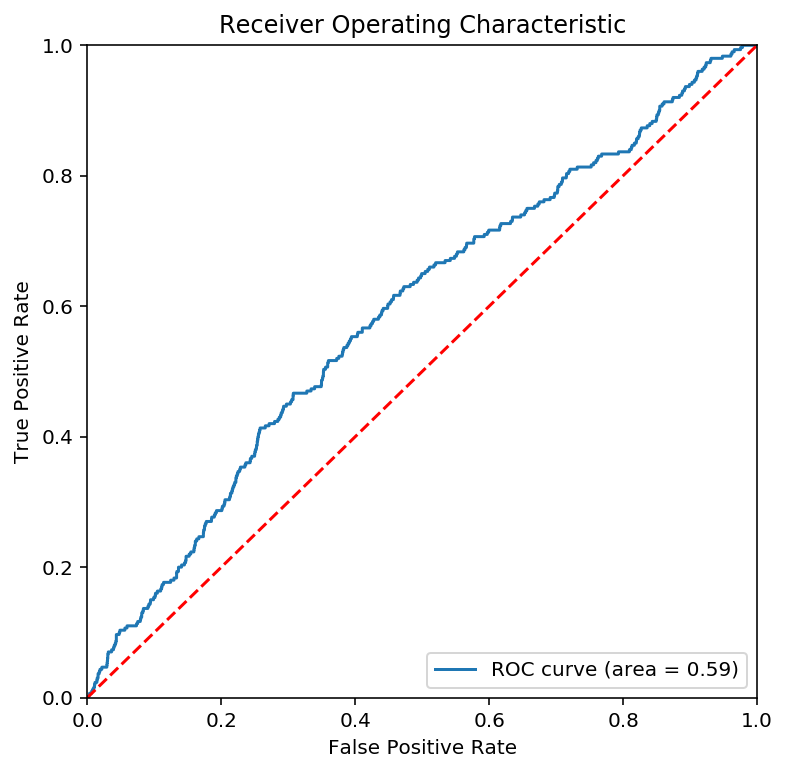

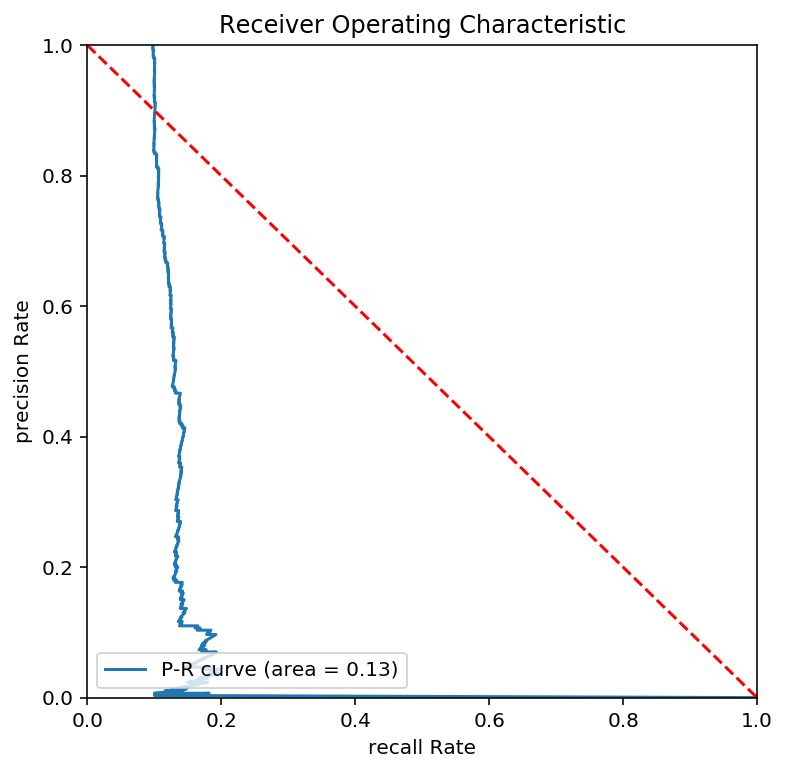


"""""" BernoulliNB """"""

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data

Looping decimal place 1
0.000->-1.0820,  0.100->-1.0013,  0.200->-0.7133,  0.300->-0.4740,  0.400->-0.4027,  0.500->-0.3327,  0.600->-0.2573,  0.700->-0.2027,  0.800->-0.1140,  0.900->0.0073,  1.000->nan,  
Looping decimal place 2
0.800->-0.1140,  0.810->-0.1040,  0.820->-0.0847,  0.830->-0.0853,  0.840->-0.0660,  0.850->-0.0493,  0.860->-0.0353,  0.870->-0.0320,  0.880->-0.0240,  0.890->-0.0053,  0.900->0.0073,  0.910->0.0293,  0.920->0.0187,  0.930->0.0040,  0.940->0.0093,  0.950->0.0027,  0.960->nan,  0.970->nan,  0.980->nan,  0.990->nan,  1.000->nan,  
Looping decimal place 3
0.900->0.0073,  0.901->0.0073,  0.902->0.0100,  0.903->0.0120,  0.904->0.0153,  0.905->0.0187,  0.906->0.0253,  0.907->0.0247,  0.908->0.0293,  0.909->0.0313,  0.910->0.0293,  0.911->0.0293,  0.912->0.0300,  0.913->0.0300,  0.914->0.0313,  0.915->0.0313,  0.916->0.0320,  0.917->0.0320,  0.918->

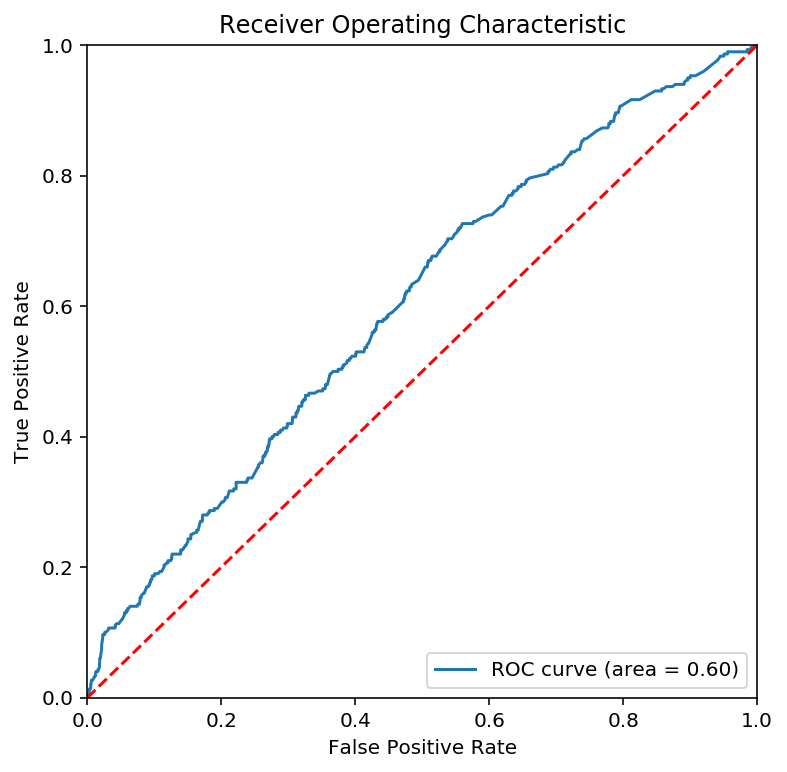

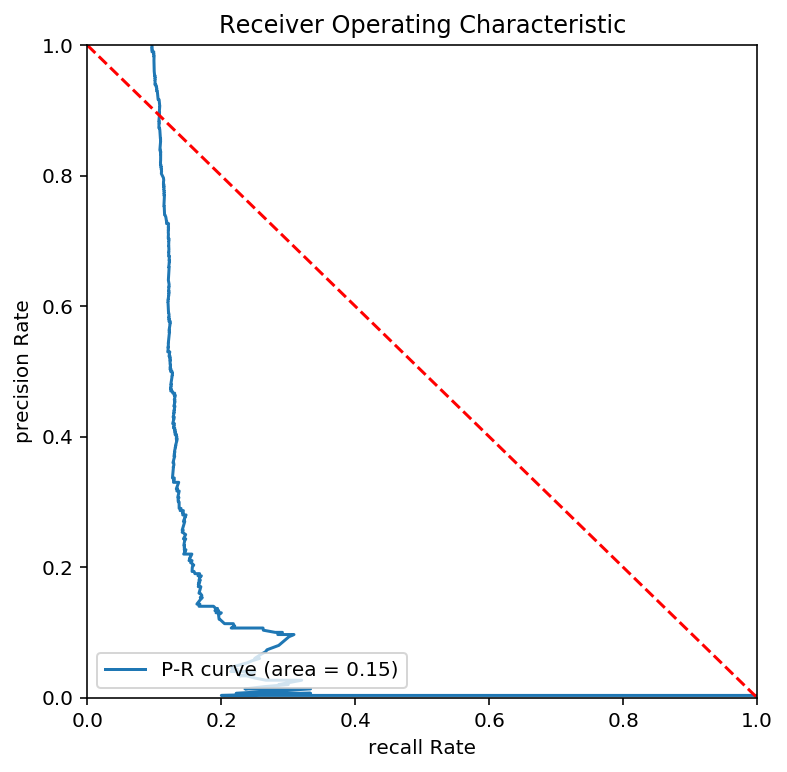

In [301]:


print('\n"""""" GaussianNB """"""')
time1 = time.time()
gnb = GaussianNB()
model_report('GaussianNB', gnb)

model_list.append('GaussianNB')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
pr_auc_list.append(model_auc2)
defined_score.append(defined_s)
time_list.append(time.time() - time1)

print('\n"""""" BernoulliNB """"""')
time1 = time.time()
bnb = BernoulliNB()
model_report('BernoulliNB', bnb)

model_list.append('BernoulliNB')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
pr_auc_list.append(model_auc2)
defined_score.append(defined_s)
time_list.append(time.time() - time1)

## Logistic Resgression


"""""" LogisticRegression """"""

Search for optimal hyperparameter C in LogisticRegresssion, vary C from 0.001 to 1000, using KFold(5) Cross Validation on train data
-0.2347, -0.2345, -0.2344, -0.2342, -0.2341, -0.2339, -0.2338, -0.2337, -0.2336, -0.2335, -0.2334, -0.2333, -0.2332, -0.2331, -0.2330, -0.2329, -0.2328, -0.2327, -0.2327, -0.2326, -0.2325, -0.2325, -0.2324, -0.2323, -0.2323, -0.2323, -0.2322, -0.2322, -0.2321, -0.2321, -0.2320, -0.2320, -0.2320, -0.2320, -0.2319, -0.2319, -0.2319, -0.2318, -0.2318, -0.2318, -0.2318, -0.2317, -0.2317, -0.2317, -0.2317, -0.2317, -0.2317, -0.2316, -0.2316, -0.2316, -0.2316, -0.2316, -0.2316, -0.2315, -0.2315, -0.2315, -0.2315, -0.2315, -0.2315, -0.2315, -0.2315, -0.2314, -0.2314, -0.2314, -0.2314, -0.2314, -0.2314, -0.2314, -0.2314, -0.2314, -0.2314, -0.2314, -0.2314, -0.2314, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2313, -0.2

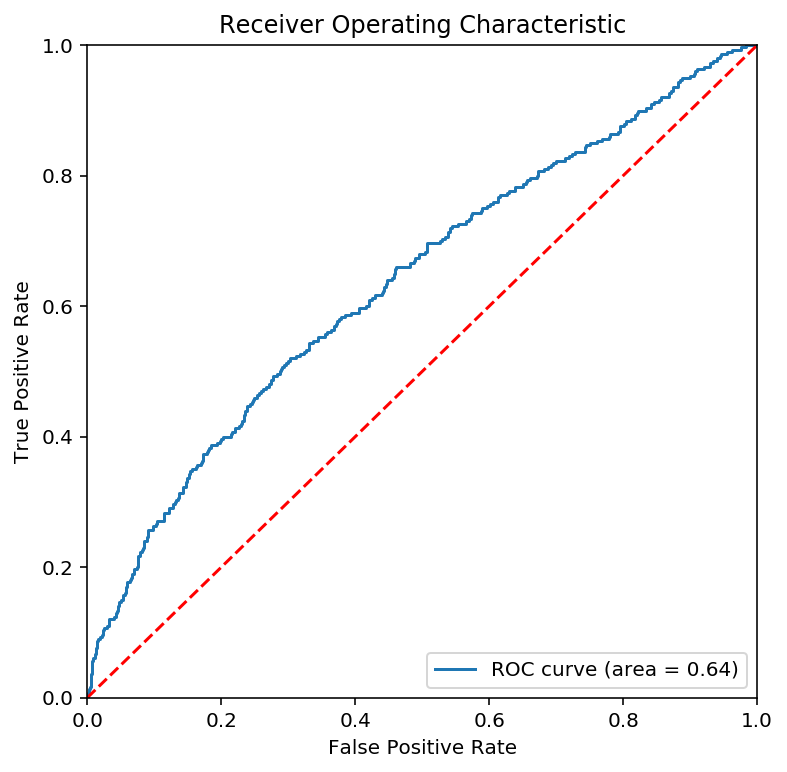

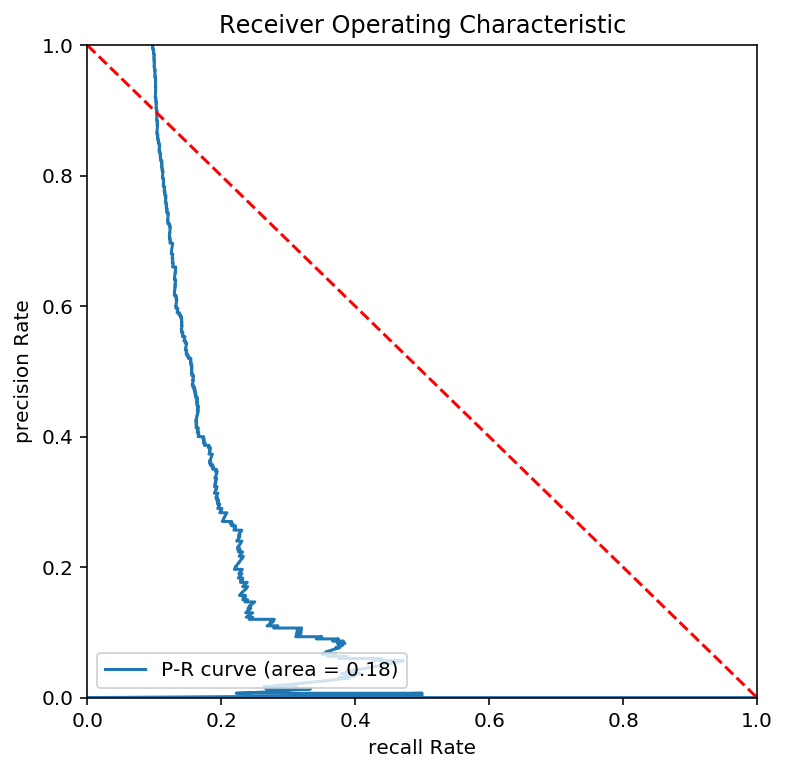

In [302]:
print('\n"""""" LogisticRegression """"""')
print('\nSearch for optimal hyperparameter C in LogisticRegresssion, vary C from 0.001 to 1000, using KFold(5) Cross Validation on train data')
kf = KFold(n_splits=5, random_state=21, shuffle=True)  #produce the k folds
score_list = []
c_list = 10**np.linspace(-3,3,200)
for c in c_list:
    logit = LogisticRegression(C = c,class_weight=weighting)
    cvs = (cross_val_score(logit, X_train, y_train, cv=kf, scoring=scoring)).mean()
    score_list.append(cvs)
    print('{:.4f}'.format(cvs), end=", ")   # 4 decimal pl
print('optimal cv F1 score = {:.4f}'.format(max(score_list)))
optimal_c = float(c_list[score_list.index(max(score_list))])
print('optimal value of C = {:.3f}'.format(optimal_c))

time1 = time.time()
logit = LogisticRegression(C = optimal_c,class_weight=weighting)
model_report('LogisticRegression', logit)

model_list.append('LogisticRegression')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
pr_auc_list.append(model_auc2)
defined_score.append(defined_s)
time_list.append(time.time() - time1)

https://stats.stackexchange.com/questions/341/knn-and-unbalanced-classes

## KNN


"""""" KNN """""" (quite slow)

Search for optimal hyperparameter K in KNN, vary K from 1 to 20, using KFold(5) Cross Validation on train data
-0.0866, -0.0894, -0.0961, -0.1020, -0.1082, -0.1135, -0.1183, -0.1231, -0.1272, -0.1317, -0.1355, -0.1391, -0.1421, -0.1451, -0.1479, -0.1503, -0.1527, -0.1548, -0.1568, -0.1588, optimal cv F1 score = -0.0866
optimal value of K = 1

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data

Looping decimal place 1
0.000->-0.0313,  0.100->-0.0313,  0.200->-0.0313,  0.300->-0.0313,  0.400->-0.0313,  0.500->-0.0313,  0.600->-0.0313,  0.700->-0.0313,  0.800->-0.0313,  0.900->-0.0313,  1.000->-0.0313,  
Looping decimal place 2
-0.100->-1.0820,  -0.090->-1.0820,  -0.080->-1.0820,  -0.070->-1.0820,  -0.060->-1.0820,  -0.050->-1.0820,  -0.040->-1.0820,  -0.030->-1.0820,  -0.020->-1.0820,  -0.010->-1.0820,  0.000->-0.0313,  0.010->-0.0313,  0.020->-0.0313,  0.030->-0.0313,  0.040->-0.0313,  0.050->-0.0313,  0.060->-0.0313

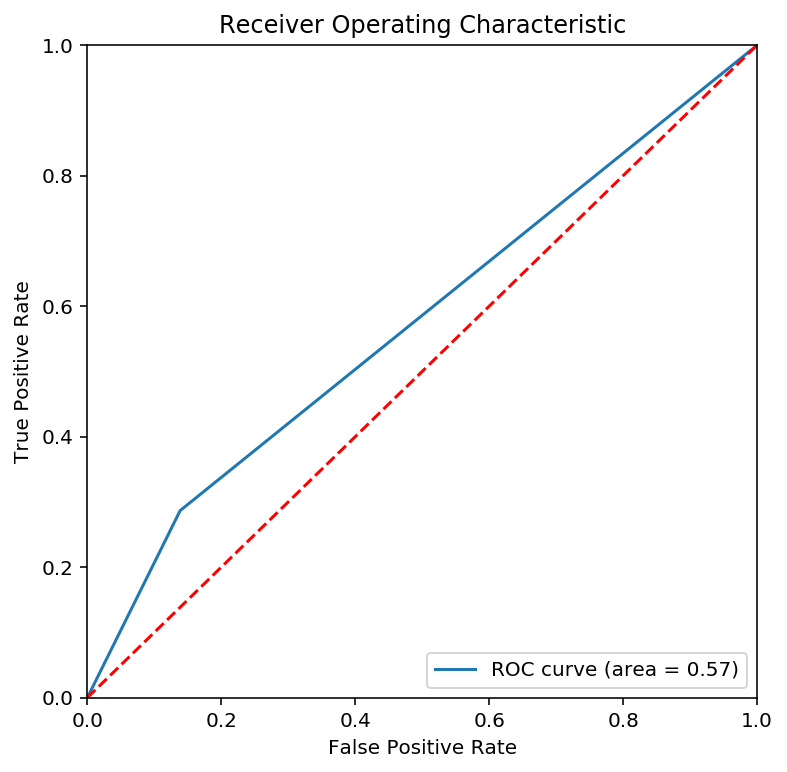

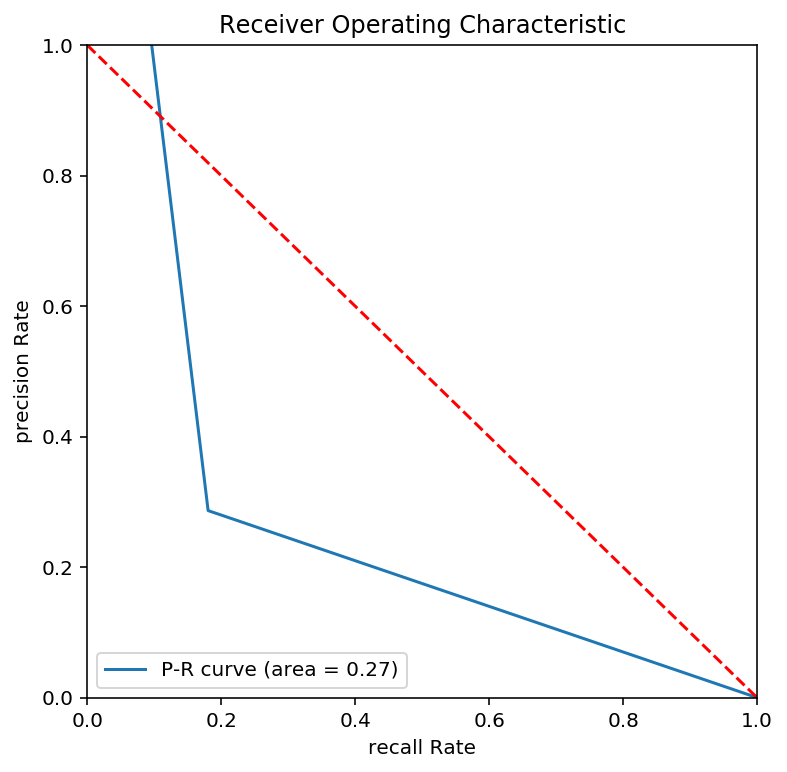


Compare with KNN classification_report (same as default threshold 0.50)
              precision    recall  f1-score   support

           0       0.92      0.86      0.89      2823
           1       0.18      0.29      0.22       300

    accuracy                           0.81      3123
   macro avg       0.55      0.57      0.56      3123
weighted avg       0.85      0.81      0.83      3123



In [303]:
print('\n"""""" KNN """""" (quite slow)')
print('\nSearch for optimal hyperparameter K in KNN, vary K from 1 to 20, using KFold(5) Cross Validation on train data')
kf = KFold(n_splits=5, random_state=21, shuffle=True)  #produce the k folds
k_scores = []
for k in range(1, 21):
    knn = KNeighborsClassifier(n_neighbors = k)
    cvs = cross_val_score(knn, X_train, y_train, cv=kf, scoring=scoring).mean()
    k_scores.append(cvs)
    print('{:.4f}'.format(cvs), end=", ")
print('optimal cv F1 score = {:.4f}'.format(max(k_scores)))   # 4 decimal pl
optimal_k = k_scores.index(max(k_scores))+1   # index 0 is for k=1
print('optimal value of K =', optimal_k)

time1 = time.time()
knn = KNeighborsClassifier(n_neighbors = optimal_k)
model_report('KNN', knn)

print('\nCompare with KNN classification_report (same as default threshold 0.50)')
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(metrics.classification_report(y_test, y_pred))

model_list.append('KNN')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
pr_auc_list.append(model_auc2)
defined_score.append(defined_s)
time_list.append(time.time() - time1)

## Decision Tree


"""""" DecisionTreeClassifier """"""

Search for optimal max_depth in DecisionTree, vary 2 to 10, using KFold(5) Cross Validation on train data
-0.2315, -0.2189, -0.2120, -0.2006, -0.1907, -0.1825, -0.1698, -0.1621, -0.1543, optimal F1 score = -0.1543
optimal max_depth = 10

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data

Looping decimal place 1
0.000->-0.8867,  0.100->-0.5660,  0.200->-0.4440,  0.300->-0.3433,  0.400->-0.1333,  0.500->-0.1000,  0.600->-0.0933,  0.700->-0.0353,  0.800->-0.0107,  0.900->0.0033,  1.000->0.0007,  
Looping decimal place 2
0.800->-0.0107,  0.810->-0.0107,  0.820->-0.0067,  0.830->-0.0093,  0.840->-0.0067,  0.850->-0.0053,  0.860->-0.0053,  0.870->-0.0120,  0.880->0.0047,  0.890->0.0053,  0.900->0.0033,  0.910->0.0093,  0.920->0.0073,  0.930->0.0047,  0.940->0.0053,  0.950->0.0053,  0.960->0.0067,  0.970->0.0013,  0.980->0.0007,  0.990->0.0007,  1.000->0.0007,  
Looping decimal place 3
0.900->0.0033,  0.901->0.0033,

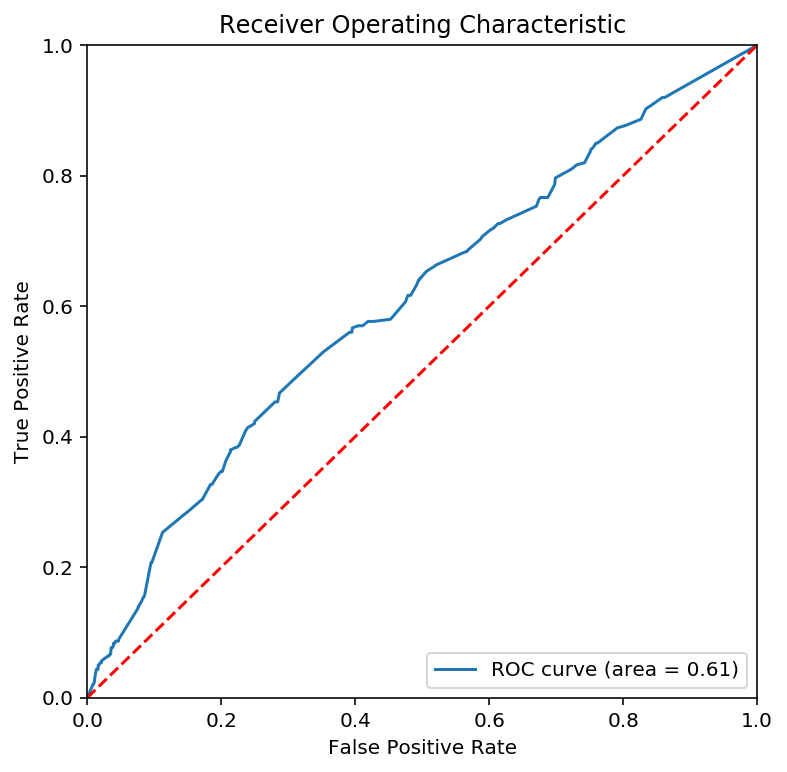

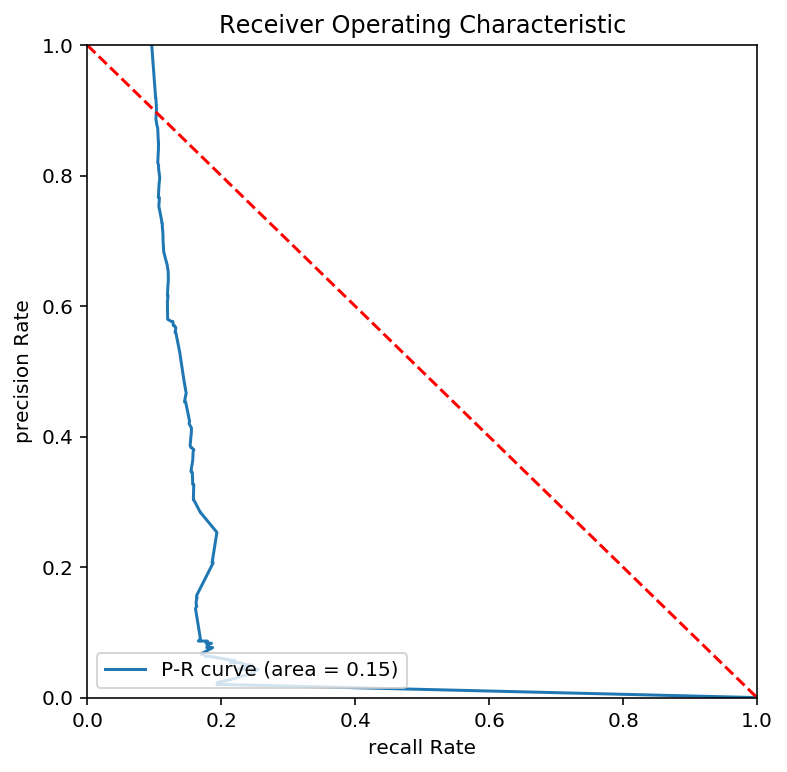

In [304]:
print('\n"""""" DecisionTreeClassifier """"""')

print('\nSearch for optimal max_depth in DecisionTree, vary 2 to 10, using KFold(5) Cross Validation on train data')
kf = KFold(n_splits=5, random_state=21, shuffle=True)  #produce the k folds
d_scores = []
for d in range(2, 11):
    decisiontree = DecisionTreeClassifier(max_depth=d,class_weight=weighting,random_state=100)
    cvs = cross_val_score(decisiontree, X_train, y_train, cv=kf, scoring=scoring).mean()
    d_scores.append(cvs)
    print('{:.4f}'.format(cvs), end=", ")
print('optimal F1 score = {:.4f}'.format(max(d_scores)))   # 4 decimal pl
optimal_d = d_scores.index(max(d_scores))+2   # index 0 is for d=2
print('optimal max_depth =', optimal_d)

time1 = time.time()
decisiontree = DecisionTreeClassifier(max_depth=optimal_d,class_weight=weighting,random_state=100)
model_report('DecisionTreeClassifier', decisiontree)

model_list.append('DecisionTreeClassifier')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
pr_auc_list.append(model_auc2)
defined_score.append(defined_s)
time_list.append(time.time() - time1)

## RandomForest


"""""" RandomForestClassifier """""" (quite slow)

Search for optimal n_estimators in RandomForest, vary 100 to 500, using KFold(5) Cross Validation on train data
100->-0.0811, 150->-0.0808, 200->-0.0806, 250->-0.0804, 300->-0.0804, 350->-0.0804, 400->-0.0803, 450->-0.0803, 500->-0.0802, optimal F1 score = -0.0802
optimal n_estimators = 500

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data

Looping decimal place 1
0.000->-1.0773,  0.100->-0.1680,  0.200->0.0820,  0.300->0.1100,  0.400->0.0573,  0.500->0.0340,  0.600->0.0207,  0.700->0.0160,  0.800->0.0080,  0.900->0.0027,  1.000->nan,  
Looping decimal place 2
0.200->0.0820,  0.210->0.0900,  0.220->0.1053,  0.230->0.1187,  0.240->0.1140,  0.250->0.1147,  0.260->0.1193,  0.270->0.1167,  0.280->0.1153,  0.290->0.1107,  0.300->0.1100,  0.310->0.1133,  0.320->0.1040,  0.330->0.0873,  0.340->0.0860,  0.350->0.0860,  0.360->0.0793,  0.370->0.0767,  0.380->0.0647,  0.390->0.0640,  0.400->0.0573,  
Loop

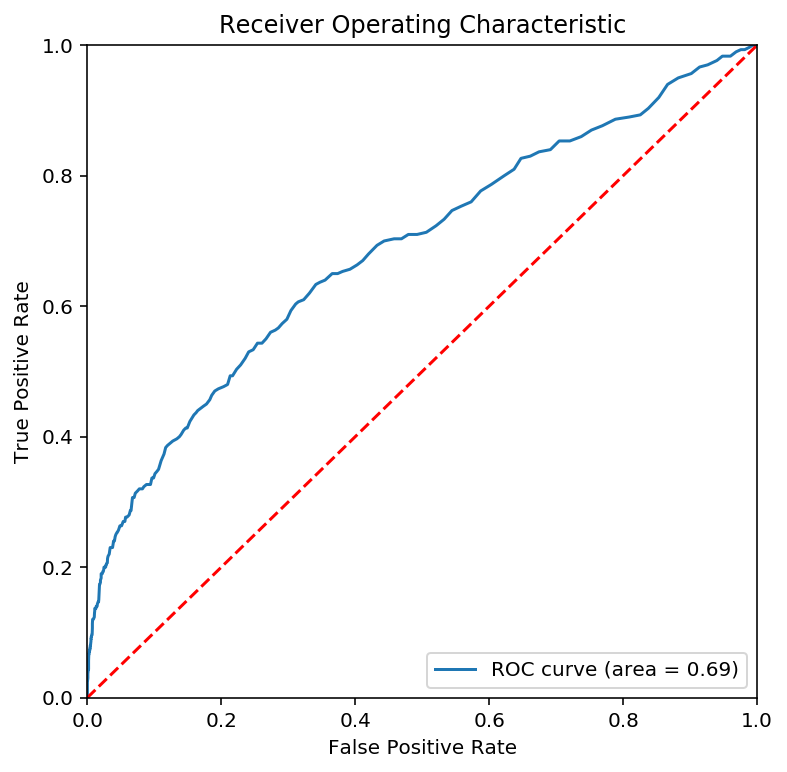

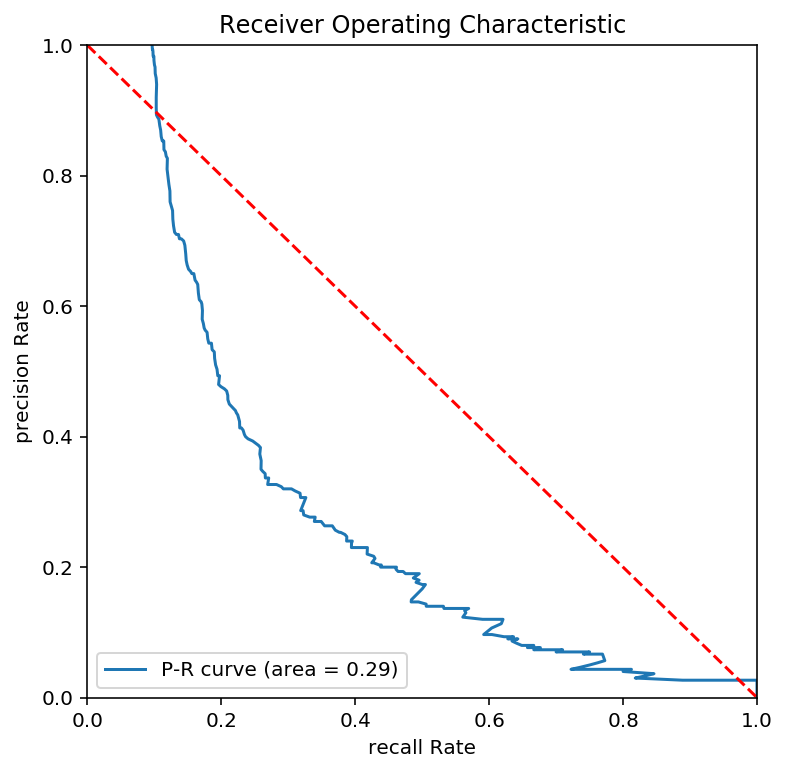

In [323]:
print('\n"""""" RandomForestClassifier """""" (quite slow)')

print('\nSearch for optimal n_estimators in RandomForest, vary 100 to 500, using KFold(5) Cross Validation on train data')
kf = KFold(n_splits=5, random_state=21, shuffle=True)  #produce the k folds
score_list = []
n_list = []
for n in [100, 150, 200, 250, 300, 350, 400, 450, 500]:
    randomforest = RandomForestClassifier(n_estimators=n,class_weight=weighting,random_state=101)
    cvs = (cross_val_score(randomforest, X_train, y_train, cv=kf, scoring=scoring)).mean()
    score_list.append(cvs)
    n_list.append(n)
    print('{:.0f}->{:.4f}'.format(n, cvs), end=", ")   # display score in 4 decimal place
print('optimal F1 score = {:.4f}'.format(max(score_list)))
optimal_n = int(n_list[score_list.index(max(score_list))])
print('optimal n_estimators = {:.0f}'.format(optimal_n))

time1 = time.time()
randomforest = RandomForestClassifier(n_estimators=optimal_n,class_weight=weighting,random_state=101)
model_report('RandomForestClassifier', randomforest)

model_list.append('RandomForestClassifier')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
pr_auc_list.append(model_auc2)
defined_score.append(defined_s)
time_list.append(time.time() - time1)

## Linear SVC


"""""" LinearSVC """"""
LinearSVC accuracy score is
Training: 60.50%
Test set: 60.74%
              precision    recall  f1-score   support

           0       0.93      0.61      0.74      2823
           1       0.14      0.59      0.22       300

    accuracy                           0.61      3123
   macro avg       0.54      0.60      0.48      3123
weighted avg       0.86      0.61      0.69      3123

LinearSVC confusion matrix: 
 [[1721 1102]
 [ 124  176]]
LinearSVC brier_score_loss: 0.3926
LinearSVC roc_auc_score: 0.5982
LinearSVC AUC: 0.5982
LinearSVC Defined Score: -0.2653


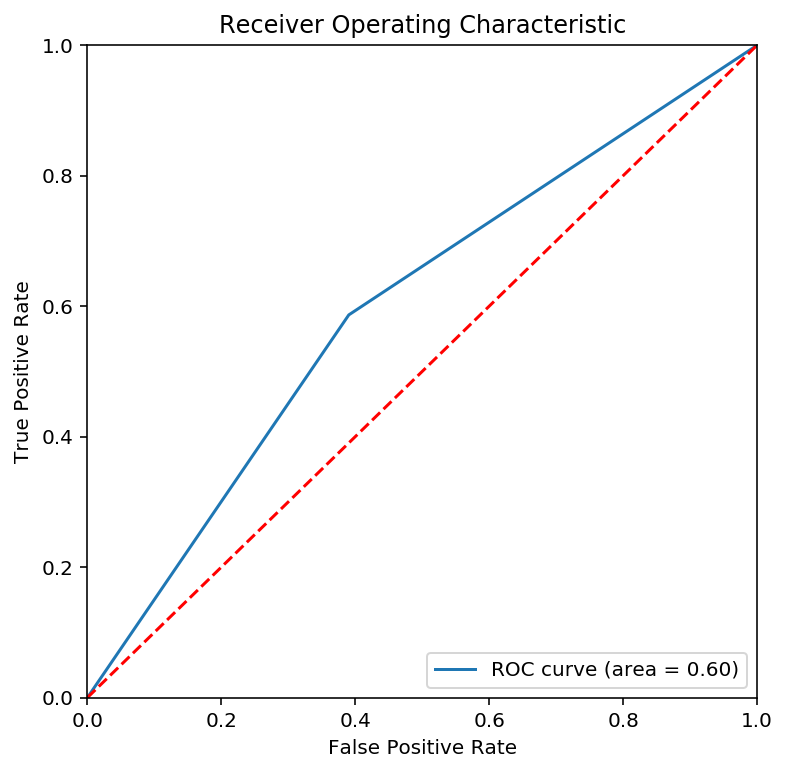

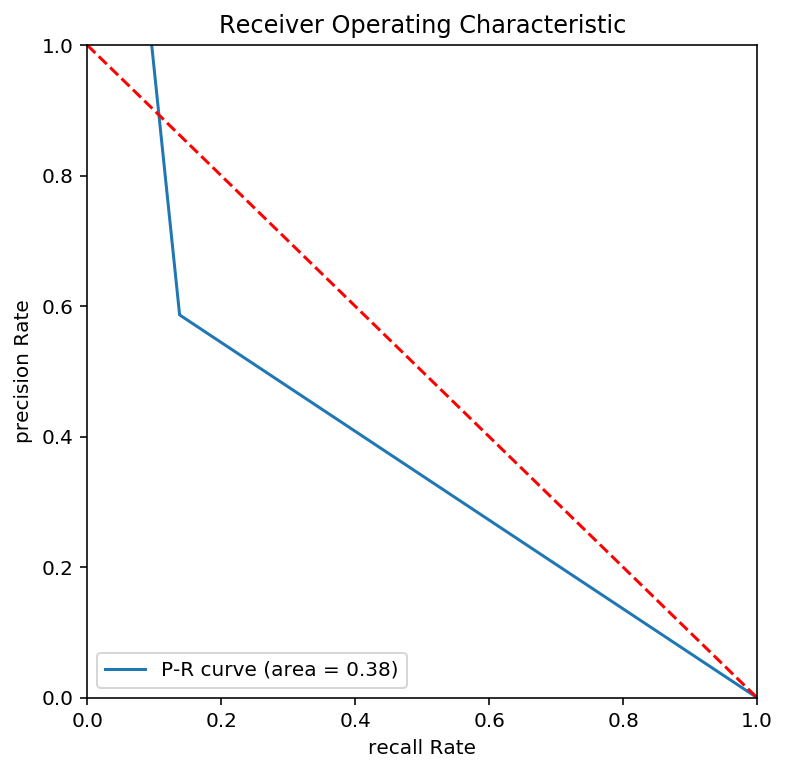

In [306]:
print('\n"""""" LinearSVC """"""')
time1 = time.time()
linearsvc = LinearSVC(dual=False,class_weight='balanced')
# model_report('LinearSVC', linearsvc)   # model has no attribute 'predict_proba'
linearsvc.fit(X_train, y_train)
print('LinearSVC accuracy score is')
print('Training: {:.2f}%'.format(100*linearsvc.score(X_train, y_train)))  # score uses accuracy
print('Test set: {:.2f}%'.format(100*linearsvc.score(X_test, y_test)))   # should use cross validation

y_pred = linearsvc.predict(X_test)
print(metrics.classification_report(y_test, y_pred))
print('LinearSVC confusion matrix: \n', confusion_matrix(y_test, y_pred))

model_f1 = f1_score(y_test, y_pred)

model_ll = brier_score_loss(y_test, y_pred)
print('LinearSVC brier_score_loss: {:.4f}'.format(model_ll))
model_roc_auc = roc_auc_score(y_test, y_pred)
print('LinearSVC roc_auc_score: {:.4f}'.format(model_roc_auc)) 
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
model_auc = auc(fpr, tpr)
precision, recall, _ = precision_recall_curve(y_test, y_pred)
model_auc2 = auc(recall, precision)
P = precision_score(y_test,y_pred)
R = recall_score(y_test,y_pred)
defined_s = (1-0.2/P)*R
print('LinearSVC AUC: {:.4f}'.format(model_auc))
print('LinearSVC Defined Score: {:.4f}'.format(defined_s))

# plot the ROC curve
plt.figure(figsize = [6,6])
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % model_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
# plt.savefig('roc_auc_score')
plt.draw()

plt.figure(figsize = [6,6])
    
plt.plot(precision,recall, label = 'P-R curve (area = %0.2f)'%model_auc2)
plt.plot([0, 1], [1, 0],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('recall Rate')
plt.ylabel('precision Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower left")
plt.draw()

plt.show()
model_list.append('LinearSVC')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
pr_auc_list.append(model_auc2)
defined_score.append(defined_s)
time_list.append(time.time() - time1)

## SVC


"""""" SVC """""" (extremely slow)

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data

Looping decimal place 1
0.000->-1.0820,  0.100->-1.0287,  0.200->-0.8513,  0.300->-0.5160,  0.400->-0.2907,  0.500->-0.1313,  0.600->-0.0180,  0.700->0.0500,  0.800->0.0580,  0.900->0.0287,  1.000->nan,  
Looping decimal place 2
0.700->0.0500,  0.710->0.0567,  0.720->0.0587,  0.730->0.0580,  0.740->0.0600,  0.750->0.0607,  0.760->0.0607,  0.770->0.0660,  0.780->0.0613,  0.790->0.0660,  0.800->0.0580,  0.810->0.0587,  0.820->0.0453,  0.830->0.0467,  0.840->0.0500,  0.850->0.0420,  0.860->0.0407,  0.870->0.0347,  0.880->0.0353,  0.890->0.0360,  0.900->0.0287,  
Looping decimal place 3
0.780->0.0613,  0.781->0.0633,  0.782->0.0640,  0.783->0.0647,  0.784->0.0647,  0.785->0.0673,  0.786->0.0680,  0.787->0.0640,  0.788->0.0640,  0.789->0.0647,  0.790->0.0660,  0.791->0.0613,  0.792->0.0627,  0.793->0.0647,  0.794->0.0653,  0.795->0.0607,  0.796->0.0607,  0.797->0.06

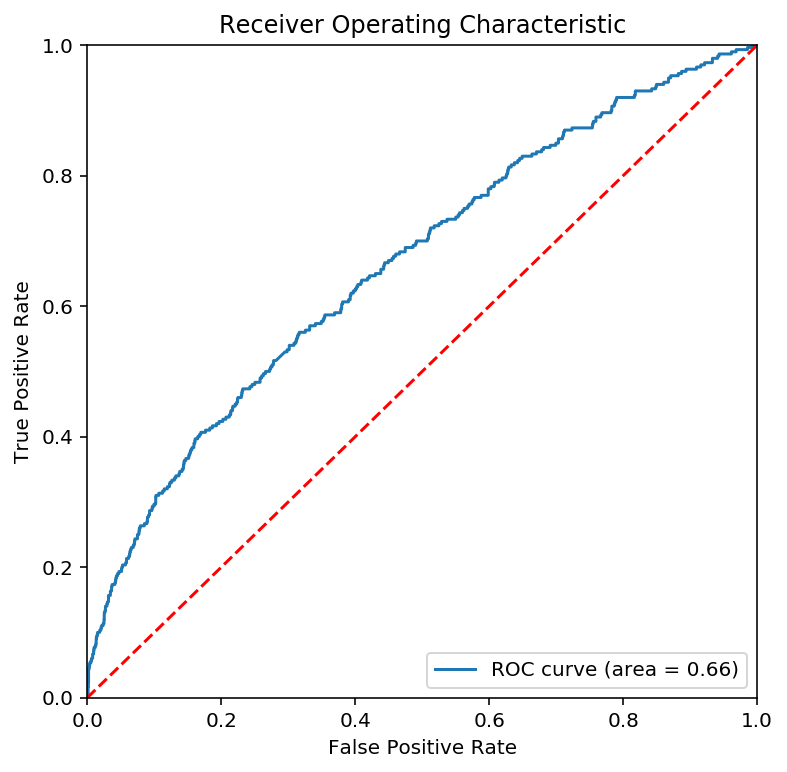

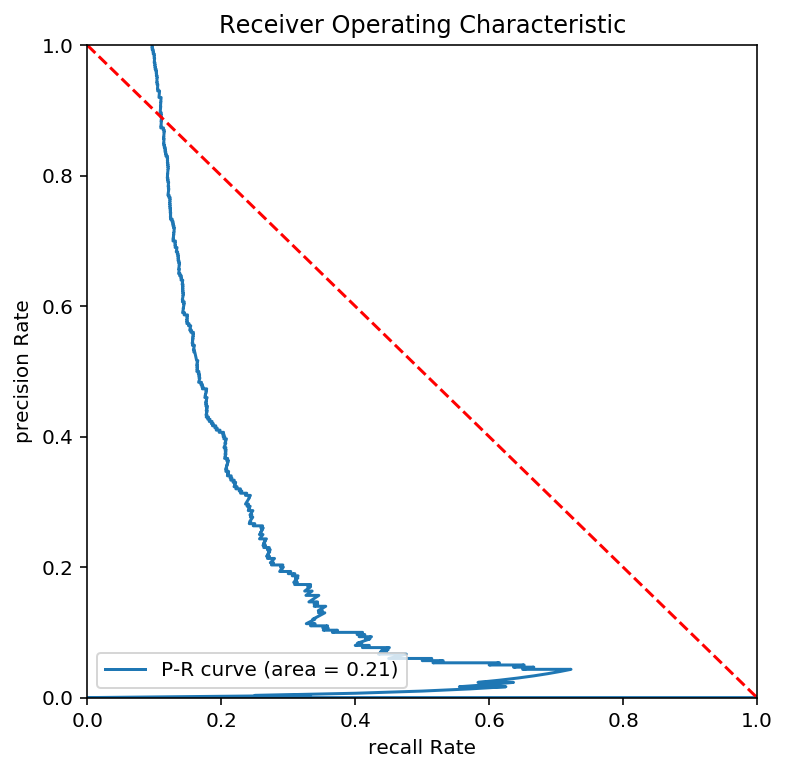

In [307]:
print('\n"""""" SVC """""" (extremely slow)')
time1 = time.time()
svc = SVC(gamma='scale', probability=True,class_weight=weighting,random_state=102)
model_report('SVC', svc)

model_list.append('SVC')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
defined_score.append(defined_s)
pr_auc_list.append(model_auc2)
time_list.append(time.time() - time1)   # use this line for actual time spent, or


## SGDC


"""""" SGDC """""" (extremely slow)

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data

Looping decimal place 1
0.000->-1.0213,  0.100->-0.9907,  0.200->-0.8907,  0.300->-0.7113,  0.400->-0.4260,  0.500->-0.1933,  0.600->-0.0940,  0.700->-0.0153,  0.800->-0.0173,  0.900->-0.0180,  1.000->-0.0080,  
Looping decimal place 2
0.900->-0.0180,  0.910->-0.0147,  0.920->-0.0100,  0.930->-0.0087,  0.940->-0.0067,  0.950->-0.0053,  0.960->-0.0073,  0.970->-0.0033,  0.980->-0.0053,  0.990->-0.0033,  1.000->-0.0080,  1.010->nan,  1.020->nan,  1.030->nan,  1.040->nan,  1.050->nan,  1.060->nan,  1.070->nan,  1.080->nan,  1.090->nan,  1.100->nan,  
Looping decimal place 3
0.980->-0.0053,  0.981->-0.0047,  0.982->-0.0047,  0.983->-0.0047,  0.984->-0.0047,  0.985->-0.0047,  0.986->-0.0047,  0.987->-0.0047,  0.988->-0.0040,  0.989->-0.0040,  0.990->-0.0033,  0.991->-0.0033,  0.992->-0.0033,  0.993->-0.0060,  0.994->-0.0060,  0.995->-0.0087,  0.996->-0.0087,  0.997

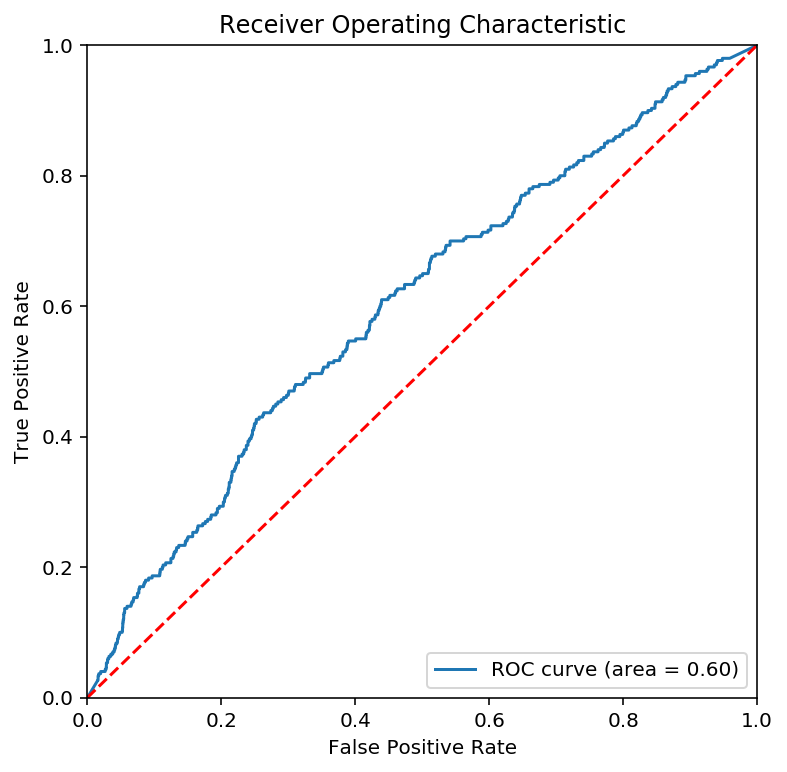

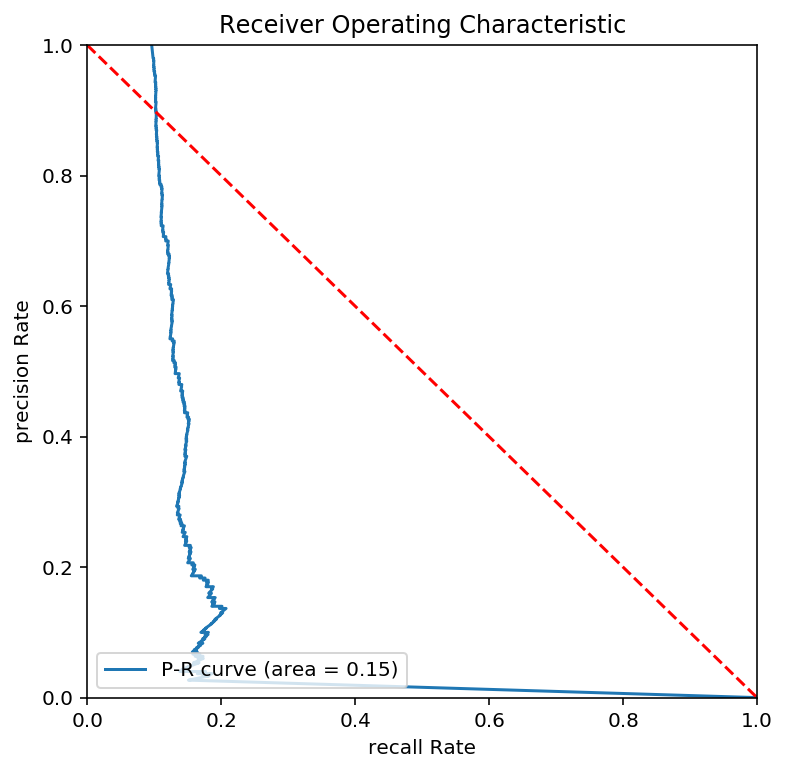

In [308]:
print('\n"""""" SGDC """""" (extremely slow)')
time1 = time.time()
SGDC = SGDClassifier(loss='modified_huber',class_weight=weighting,random_state=103)
model_report('SGDC', SGDC)

model_list.append('SGDC')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
defined_score.append(defined_s)
pr_auc_list.append(model_auc2)
time_list.append(time.time() - time1)   # use this line for actual time spent, or


## AdaBoost


Search for optimal n_estimators in AdaBoost, vary 100 to 500, using KFold(5) Cross Validation on train data
100->-0.2470, 150->-0.2477, 200->-0.2480, 250->-0.2481, 300->-0.2483, 350->-0.2485, 400->-0.2486, 450->-0.2487, 500->-0.2488, optimal F1 score = -0.2470
optimal n_estimators = 100

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data

Looping decimal place 1
0.000->-1.0820,  0.100->-1.0820,  0.200->-1.0820,  0.300->-1.0820,  0.400->-1.0820,  0.500->-0.0907,  0.600->nan,  0.700->nan,  0.800->nan,  0.900->nan,  1.000->nan,  
Looping decimal place 2
0.400->-1.0820,  0.410->-1.0820,  0.420->-1.0820,  0.430->-1.0820,  0.440->-1.0820,  0.450->-1.0820,  0.460->-1.0820,  0.470->-1.0820,  0.480->-1.0820,  0.490->-1.0113,  0.500->-0.0907,  0.510->nan,  0.520->nan,  0.530->nan,  0.540->nan,  0.550->nan,  0.560->nan,  0.570->nan,  0.580->nan,  0.590->nan,  0.600->nan,  
Looping decimal place 3
0.490->-1.0113,  0.491->-1.0060,  0.492->-0.9940,  0.493->-0.9

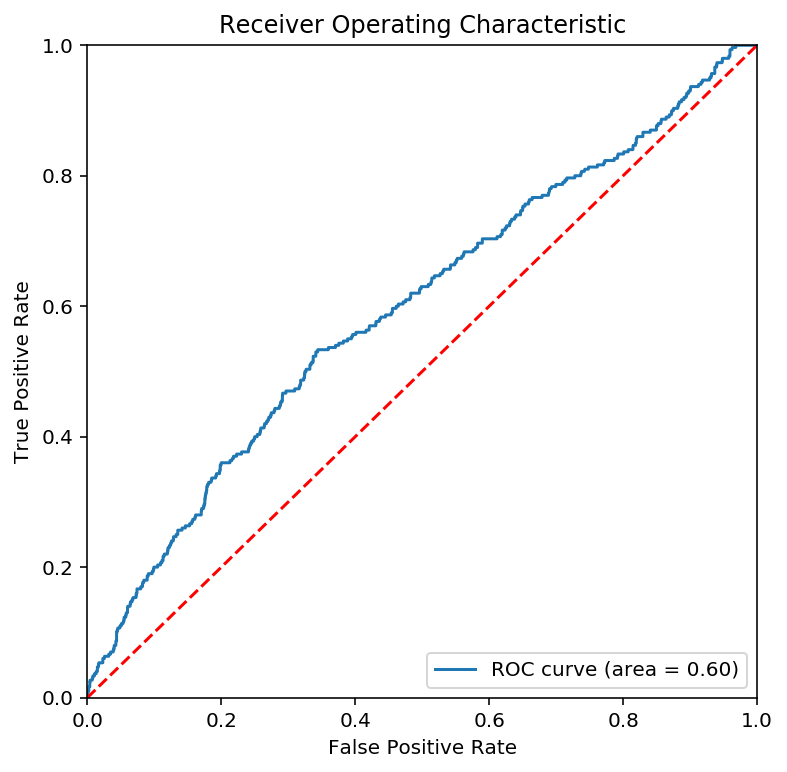

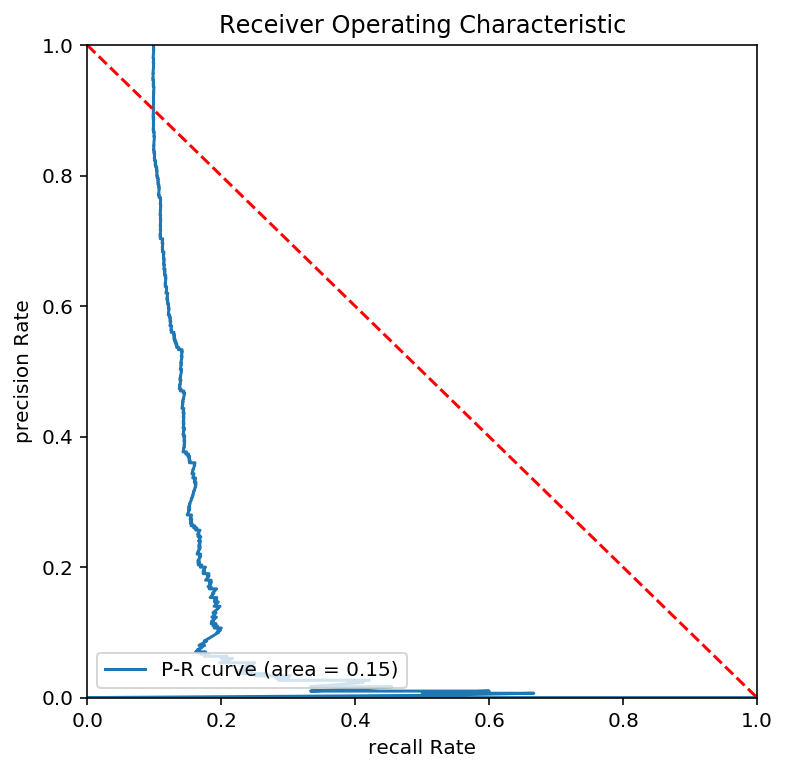

In [309]:
from sklearn.ensemble import AdaBoostClassifier
print('\nSearch for optimal n_estimators in AdaBoost, vary 100 to 500, using KFold(5) Cross Validation on train data')
kf = KFold(n_splits=5, random_state=21, shuffle=True)  #produce the k folds
score_list = []
n_list = []
for n in [100, 150, 200, 250, 300, 350, 400, 450, 500]:
    ada = AdaBoostClassifier(n_estimators=n,random_state=200)
    cvs = (cross_val_score(ada, X_train, y_train, cv=kf, scoring=scoring)).mean()
    score_list.append(cvs)
    n_list.append(n)
    print('{:.0f}->{:.4f}'.format(n, cvs), end=", ")   # display score in 4 decimal place
print('optimal F1 score = {:.4f}'.format(max(score_list)))
optimal_n = int(n_list[score_list.index(max(score_list))])
print('optimal n_estimators = {:.0f}'.format(optimal_n))

time1 = time.time()
ada = AdaBoostClassifier(n_estimators=optimal_n,
                         learning_rate=1,random_state=200)
model_report('AdaBoost', ada)

model_list.append('AdaBoost')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
defined_score.append(defined_s)
pr_auc_list.append(model_auc2)
time_list.append(time.time() - time1)   # use this line for actual time spent, or


## Xgboost


Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data

Looping decimal place 1
0.000->-0.9307,  0.100->0.0280,  0.200->0.0833,  0.300->0.0753,  0.400->0.0747,  0.500->0.0853,  0.600->0.0807,  0.700->0.0853,  0.800->0.0893,  0.900->0.0707,  1.000->nan,  
Looping decimal place 2
0.700->0.0853,  0.710->0.0867,  0.720->0.0887,  0.730->0.0873,  0.740->0.0880,  0.750->0.0887,  0.760->0.0867,  0.770->0.0880,  0.780->0.0847,  0.790->0.0867,  0.800->0.0893,  0.810->0.0900,  0.820->0.0927,  0.830->0.0900,  0.840->0.0893,  0.850->0.0820,  0.860->0.0807,  0.870->0.0740,  0.880->0.0733,  0.890->0.0720,  0.900->0.0707,  
Looping decimal place 3
0.810->0.0900,  0.811->0.0900,  0.812->0.0907,  0.813->0.0907,  0.814->0.0913,  0.815->0.0913,  0.816->0.0920,  0.817->0.0920,  0.818->0.0920,  0.819->0.0920,  0.820->0.0927,  0.821->0.0933,  0.822->0.0947,  0.823->0.0947,  0.824->0.0947,  0.825->0.0947,  0.826->0.0953,  0.827->0.0953,  0.828->0.0953,  0.829->0.0900,  0.830

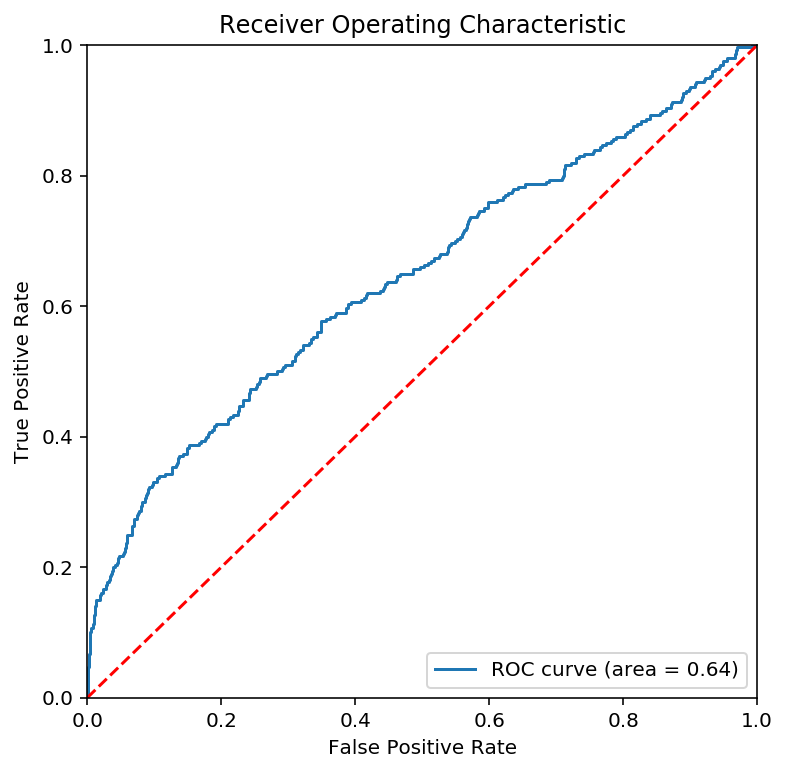

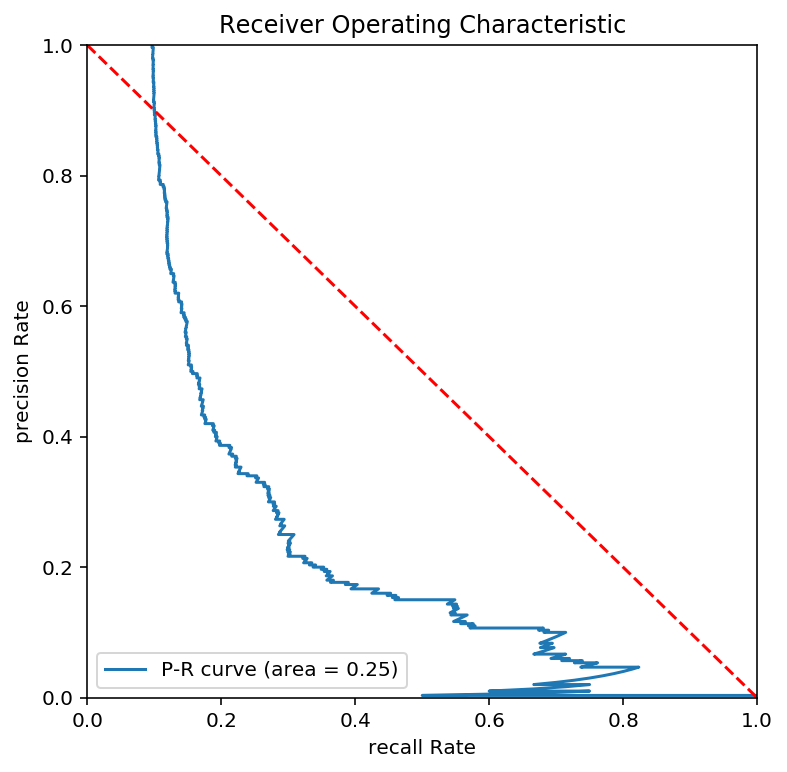

In [310]:
from xgboost import XGBClassifier


time1 = time.time()
xgb = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                    colsample_bytree=1, gamma=0, learning_rate=0.9, max_delta_step=0,
                    max_depth = 7, min_child_weight=1, missing=None, n_estimators=100,
                    n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
                    reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
                    silent=True, subsample=1)

model_report('Xgboost', xgb)

model_list.append('Xgboost')
f1_list.append(model_f1)
auc_list.append(model_auc)
ll_list.append(model_ll)
roc_auc_list.append(model_roc_auc)
defined_score.append(defined_s)
pr_auc_list.append(model_auc2)
time_list.append(time.time() - time1)   # use this line for actual time spent, or


## Metrics Comparison

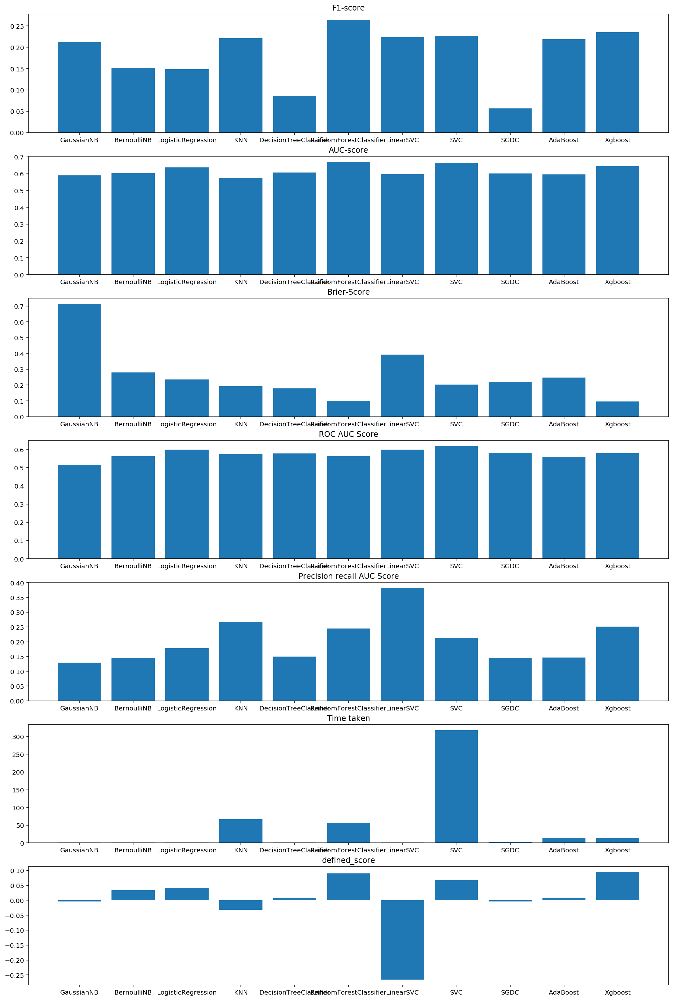

In [311]:
## plot the classification report scores
fig, ax = plt.subplots(7, 1, figsize=(18, 28))
# fig.set_figwidth(10)
# fig.set_figheight(6)
# fig.suptitle('Main Title',fontsize = 16)
ax[0].bar(model_list, f1_list)
ax[0].set_title('F1-score')
ax[1].bar(model_list, auc_list)
ax[1].set_title('AUC-score');
ax[2].bar(model_list, ll_list)
ax[2].set_title('Brier-Score')
ax[3].bar(model_list, roc_auc_list)
ax[3].set_title('ROC AUC Score')
ax[4].bar(model_list, pr_auc_list)
ax[4].set_title('Precision recall AUC Score')
ax[5].bar(model_list, time_list)
ax[5].set_title('Time taken')
ax[6].bar(model_list, defined_score)
ax[6].set_title('defined_score')

# Fine-tune figure; make subplots farther from each other, or nearer to each other.
fig.subplots_adjust(hspace=0.2, wspace=0.2)

https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

## ROC Curves Comparsion

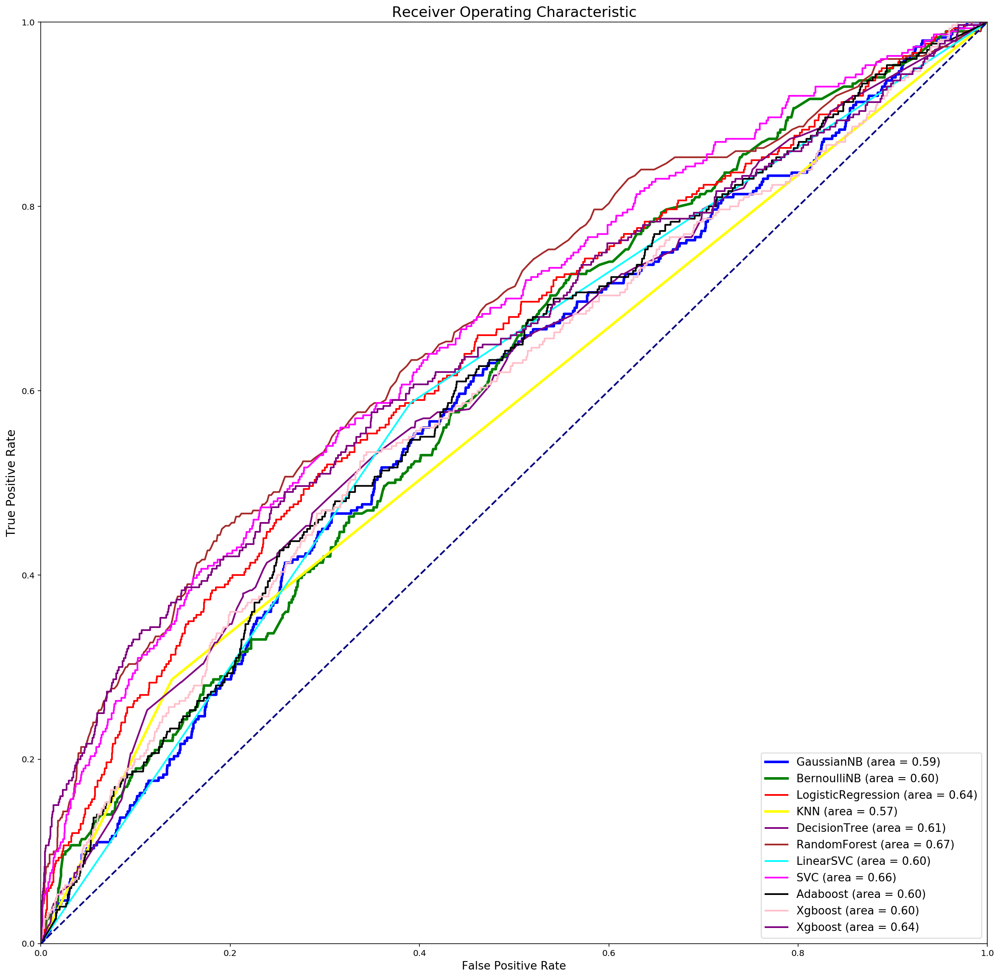

In [312]:
# plot the ROC curves
plt.figure(figsize=(20,20))

y_pred = gnb.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='blue',
        lw=3, label='GaussianNB (area = %0.2f)' % auc_list[0])

y_pred = bnb.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='green',
        lw=3, label='BernoulliNB (area = %0.2f)' % auc_list[1])

y_pred = logit.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='red',
        lw=2, label='LogisticRegression (area = %0.2f)' % auc_list[2])

y_pred = knn.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='yellow',
        lw=3, label='KNN (area = %0.2f)' % auc_list[3])

y_pred = decisiontree.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='purple',
        lw=2, label='DecisionTree (area = %0.2f)' % auc_list[4])

y_pred = randomforest.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='brown',
        lw=2, label='RandomForest (area = %0.2f)' % auc_list[5])

y_pred = linearsvc.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='cyan',
        lw=2, label='LinearSVC (area = %0.2f)' % auc_list[6])

y_pred = svc.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='magenta',
        lw=2, label='SVC (area = %0.2f)' % auc_list[7])

y_pred = SGDC.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='black',
        lw=2, label='Adaboost (area = %0.2f)' % auc_list[8])

y_pred = ada.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='pink',
        lw=2, label='Xgboost (area = %0.2f)' % auc_list[9])

y_pred = xgb.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='purple',
        lw=2, label='Xgboost (area = %0.2f)' % auc_list[10])

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate', fontsize=13)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('Receiver Operating Characteristic', fontsize=17)
plt.legend(loc='lower right', fontsize=13)
plt.show()

In [313]:
pr_auc_list

[0.1288455994857653,
 0.14502904889142498,
 0.17779275632635175,
 0.2677420114911279,
 0.15022516145722153,
 0.2450597720244186,
 0.38204362904935213,
 0.2133198945985574,
 0.14558687780283125,
 0.14629634870129693,
 0.2508551323532703]

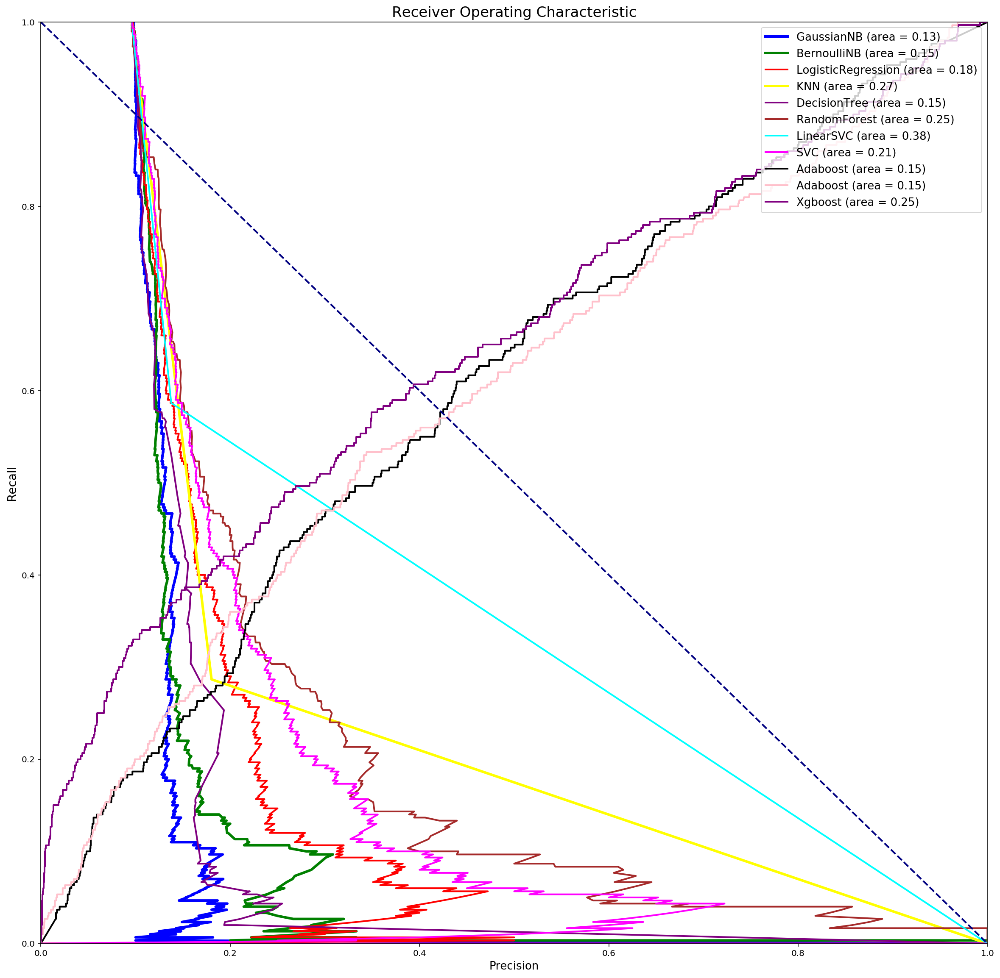

In [314]:
# plot the ROC curves
plt.figure(figsize=(20,20))

y_pred = gnb.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = precision_recall_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='blue',
        lw=3, label='GaussianNB (area = %0.2f)' % pr_auc_list[0])

y_pred = bnb.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = precision_recall_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='green',
        lw=3, label='BernoulliNB (area = %0.2f)' % pr_auc_list[1])

y_pred = logit.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = precision_recall_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='red',
        lw=2, label='LogisticRegression (area = %0.2f)' % pr_auc_list[2])

y_pred = knn.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = precision_recall_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='yellow',
        lw=3, label='KNN (area = %0.2f)' % pr_auc_list[3])

y_pred = decisiontree.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = precision_recall_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='purple',
        lw=2, label='DecisionTree (area = %0.2f)' % pr_auc_list[4])

y_pred = randomforest.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = precision_recall_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='brown',
        lw=2, label='RandomForest (area = %0.2f)' % pr_auc_list[5])

y_pred = linearsvc.predict(X_test)
fpr, tpr, thresholds = precision_recall_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='cyan',
        lw=2, label='LinearSVC (area = %0.2f)' % pr_auc_list[6])

y_pred = svc.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = precision_recall_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='magenta',
        lw=2, label='SVC (area = %0.2f)' % pr_auc_list[7])

y_pred = SGDC.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='black',
        lw=2, label='Adaboost (area = %0.2f)' % pr_auc_list[8])

y_pred = ada.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='pink',
        lw=2, label='Adaboost (area = %0.2f)' % pr_auc_list[9])

y_pred = xgb.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot(fpr, tpr, color='purple',
        lw=2, label='Xgboost (area = %0.2f)' % pr_auc_list[10])

plt.plot([0, 1], [1, 0], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('Precision', fontsize=13)
plt.ylabel('Recall', fontsize=14)
plt.title('Receiver Operating Characteristic', fontsize=17)
plt.legend(loc='upper right', fontsize=13)
plt.show()

### Stacking 

Use different classifiers to predict validation set and test set. Stack the prediction of different model into validation y test set and treat it as new training data set which label is y and features are predictions of different model. Finally, test the model in our final test set

In [289]:
# reconstruct training set and test set for convenient of function reuse
X_train = y_test_input.iloc[:,1:]
y_train = y_test_input.iloc[:,0]
X_test = Y_True_Test_input.iloc[:,1:]
y_test = Y_True_Test_input.iloc[:,0]

In [290]:
def model_report(model_name, model):
    print('\nSearch for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data')
    model.fit(X_train, y_train)
    optimal_th = 0.5   # start with default threshold value
    
    for i in range(0,3):
        score_list = []
        f1_score_list = []
        print('\nLooping decimal place', i+1) 
        th_list = [np.linspace(optimal_th-0.4999, optimal_th+0.4999, 11), 
                  # eg [ 0.0001 , 0.1008, 0.2006, 0.3004, 0.4002, 0.5, 0.5998, 0.6996, 0.7994, 0.8992, 0.9999 ]
                 np.linspace(optimal_th-0.1, optimal_th+0.1, 21), 
                  # eg 0.3xx [ 0.2 , 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 ]
                 np.linspace(optimal_th-0.01, optimal_th+0.01, 21)]
                  # eg 0.30x [ 0.29 , 0.291, 0.292, 0.293, 0.294, 0.295, 0.296, 0.297, 0.298, 0.299, 0.3  , 0.301, 0.302, 0.303, 0.304, 0.305, 0.306, 0.307, 0.308, 0.309, 0.31 ]
        for th in th_list[i]:
            y_pred = (model.predict_proba(X_test)[:,1] >= th)
            P =  precision_score(y_test, y_pred)
            R = recall_score(y_test, y_pred)
            scor =(1-0.2/P)*R
            score_list.append(scor)
            F_score = f1_score(y_test, y_pred)
            f1_score_list.append(F_score)
            print('{:.3f}->{:.4f}'.format(th, scor), end=',  ')   # display score in 4 decimal pl
        optimal_th = float(th_list[i][score_list.index(max(score_list))])
        optimal_th_f1 = float(th_list[i][f1_score_list.index(max(f1_score_list))])
    print('')
    print('optimal Defined score = {:.4f}'.format(max(score_list)))
    print('optimal threshold = {:.8f}'.format(optimal_th))

    print('optimal F1 score = {:.4f}'.format(max(f1_score_list)))
    print('optimal threshold_f1 = {:.8f}'.format(optimal_th_f1))
    
    print(model_name, 'accuracy score is')
    print('Training: {:.2f}%'.format(100*model.score(X_train, y_train)))  # score uses accuracy
    print('Test set: {:.2f}%'.format(100*model.score(X_test, y_test)))   # should use cross validation

    y_pred = (model.predict_proba(X_test)[:,1] >= 0.25)
    print('\nAdjust threshold to 0.25:')
    print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f}'.format(
        precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred)))
    print(model_name, 'confusion matrix: \n', confusion_matrix(y_test, y_pred))

    y_pred = model.predict(X_test)
    print('\nDefault threshold of 0.50:')
    print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f}'.format(
        precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred)))
    print(model_name, 'confusion matrix: \n', confusion_matrix(y_test, y_pred))

    y_pred = (model.predict_proba(X_test)[:,1] >= 0.75)
    print('\nAdjust threshold to 0.75:')
    print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f}'.format(
        precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred)))
    print(model_name, 'confusion matrix: \n', confusion_matrix(y_test, y_pred))

    y_pred = (model.predict_proba(X_test)[:,1] >= optimal_th)
    print('\nOptimal threshold(defined) {:.8f}'.format(optimal_th))
    print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f},Defined_score:{:.4f}'.format(
        precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred),(1-0.2/precision_score(y_test,y_pred))*recall_score(y_test,y_pred)))
    print(model_name, 'confusion matrix: \n', confusion_matrix(y_test, y_pred))
    
    y_pred = (model.predict_proba(X_test)[:,1] >= optimal_th_f1)
    print('\nOptimal threshold(F1) {:.8f}'.format(optimal_th_f1))
    print('Precision: {:.4f},   Recall: {:.4f},   F1 Score: {:.4f},Defined_score:{:.4f}'.format(
        precision_score(y_test, y_pred), recall_score(y_test, y_pred), f1_score(y_test, y_pred),(1-0.2/precision_score(y_test,y_pred))*recall_score(y_test,y_pred)))
    print(model_name, 'confusion matrix: \n', confusion_matrix(y_test, y_pred))
    
    global model_f1, model_auc, model_ll, model_roc_auc, model_auc2,defined_s
    model_f1 = f1_score(y_test, y_pred)
    defined_s = max(score_list)
    y_pred = model.predict_proba(X_test)
    
    model_ll = brier_score_loss(y_test, y_pred[:,1])
    print(model_name, 'brier_score_loss: {:.4f}'.format(model_ll))
    y_pred = model.predict(X_test)
    model_roc_auc = roc_auc_score(y_test, y_pred)
    print(model_name, 'roc_auc_score: {:.4f}'.format(model_roc_auc)) 
    y_pred = model.predict_proba(X_test)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    precision, recall, _ = precision_recall_curve(y_test, y_pred)
    model_auc = auc(fpr, tpr)
    model_auc2 = auc(recall, precision)
    print(model_name, "Precision_recall AUC: {:.4f}".format(model_auc2))
    print(model_name, 'AUC: {:.4f}'.format(model_auc))
    print(model_name, 'Optimal Defined score {:.4f}'.format(defined_s))
    print(model_name, 'Optimal F1 score {:.4f}'.format(model_f1))

    # plot the ROC curve
    plt.figure(figsize = [6,6])
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % model_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    # plt.savefig('roc_auc_score')
    plt.draw()
    
    plt.figure(figsize = [6,6])
    
    plt.plot(precision,recall, label = 'P-R curve (area = %0.2f)'%model_auc2)
    plt.plot([0, 1], [1, 0],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('recall Rate')
    plt.ylabel('precision Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower left")
    plt.draw()
    
    plt.show()
    return


"""""" LogisticRegression """"""

Search for optimal hyperparameter C in LogisticRegresssion, vary C from 0.001 to 1000, using KFold(5) Cross Validation on train data
-0.1156, -0.1135, -0.1115, -0.1096, -0.1078, -0.1061, -0.1044, -0.1029, -0.1014, -0.1000, -0.0987, -0.0975, -0.0964, -0.0953, -0.0943, -0.0933, -0.0924, -0.0915, -0.0908, -0.0900, -0.0893, -0.0886, -0.0880, -0.0874, -0.0868, -0.0863, -0.0858, -0.0853, -0.0848, -0.0844, -0.0840, -0.0835, -0.0831, -0.0827, -0.0824, -0.0820, -0.0816, -0.0813, -0.0809, -0.0806, -0.0802, -0.0799, -0.0796, -0.0792, -0.0789, -0.0786, -0.0783, -0.0780, -0.0777, -0.0774, -0.0771, -0.0768, -0.0765, -0.0762, -0.0759, -0.0756, -0.0754, -0.0751, -0.0749, -0.0747, -0.0744, -0.0742, -0.0740, -0.0738, -0.0736, -0.0734, -0.0733, -0.0731, -0.0730, -0.0728, -0.0727, -0.0726, -0.0725, -0.0724, -0.0723, -0.0722, -0.0721, -0.0720, -0.0719, -0.0719, -0.0718, -0.0718, -0.0717, -0.0717, -0.0716, -0.0716, -0.0716, -0.0715, -0.0715, -0.0715, -0.0715, -0.0714, -0.0

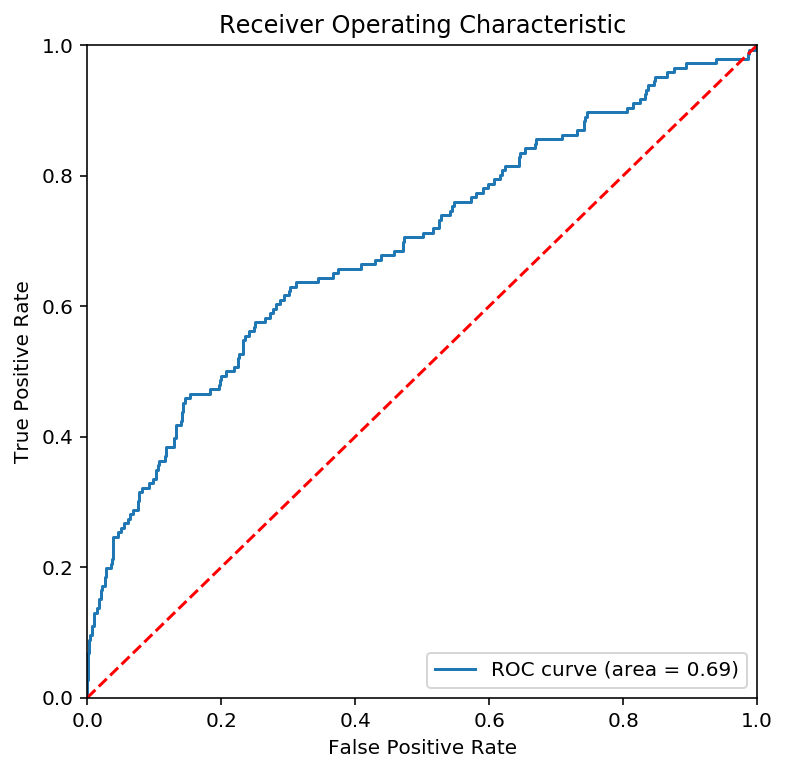

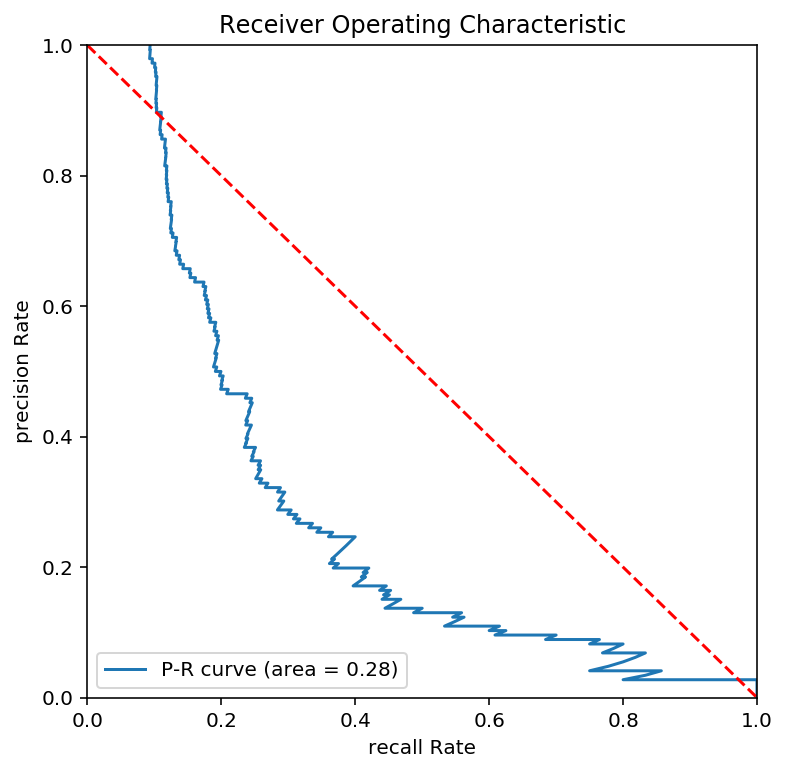

In [291]:
print('\n"""""" LogisticRegression """"""')
print('\nSearch for optimal hyperparameter C in LogisticRegresssion, vary C from 0.001 to 1000, using KFold(5) Cross Validation on train data')
kf = KFold(n_splits=5, random_state=21, shuffle=True)  #produce the k folds
score_list = []
c_list = 10**np.linspace(-3,3,200)
for c in c_list:
    logit = LogisticRegression(C = c,class_weight=weighting)
    cvs = (cross_val_score(logit, X_train, y_train, cv=kf, scoring=scoring)).mean()
    score_list.append(cvs)
    print('{:.4f}'.format(cvs), end=", ")   # 4 decimal pl
print('optimal cv {} score = {:.4f}'.format(scoring,max(score_list)))
optimal_c = float(c_list[score_list.index(max(score_list))])
print('optimal value of C = {:.3f}'.format(optimal_c))

time1 = time.time()
logit = LogisticRegression(C = optimal_c,class_weight=weighting)
model_report('LogisticRegression', logit)

model_list.append('LogisticRegression')


"""""" RandomForestClassifier """""" (quite slow)

Search for optimal n_estimators in RandomForest, vary 100 to 500, using KFold(5) Cross Validation on train data
100->-0.0737, 150->-0.0736, 200->-0.0735, 250->-0.0733, 300->-0.0733, 350->-0.0731, 400->-0.0732, 450->-0.0732, 500->-0.0731, optimal brier_score_loss score = -0.0731
optimal n_estimators = 500

Search for OPTIMAL THRESHOLD, vary from 0.0001 to 0.9999, fit/predict on train/test data

Looping decimal place 1
0.000->-1.1082,  0.100->-0.1452,  0.200->0.0795,  0.300->0.1096,  0.400->0.0863,  0.500->0.0534,  0.600->0.0438,  0.700->0.0274,  0.800->0.0055,  0.900->nan,  1.000->nan,  
Looping decimal place 2
0.200->0.0795,  0.210->0.1041,  0.220->0.1110,  0.230->0.0890,  0.240->0.1014,  0.250->0.1027,  0.260->0.1055,  0.270->0.0973,  0.280->0.0959,  0.290->0.1096,  0.300->0.1096,  0.310->0.1123,  0.320->0.1164,  0.330->0.1192,  0.340->0.1192,  0.350->0.1055,  0.360->0.0959,  0.370->0.0932,  0.380->0.0973,  0.390->0.0959,  0.400->0.0

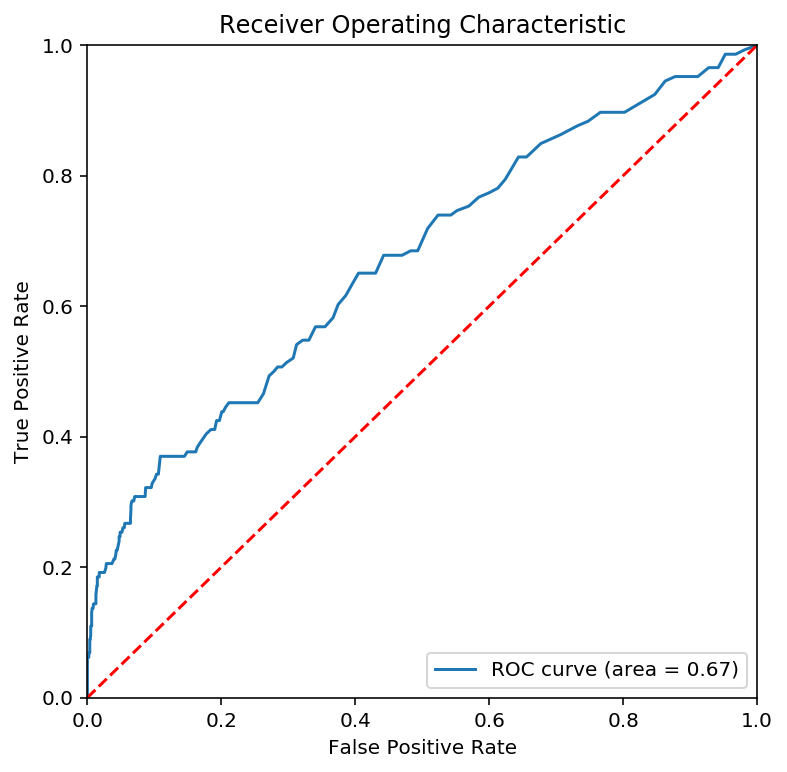

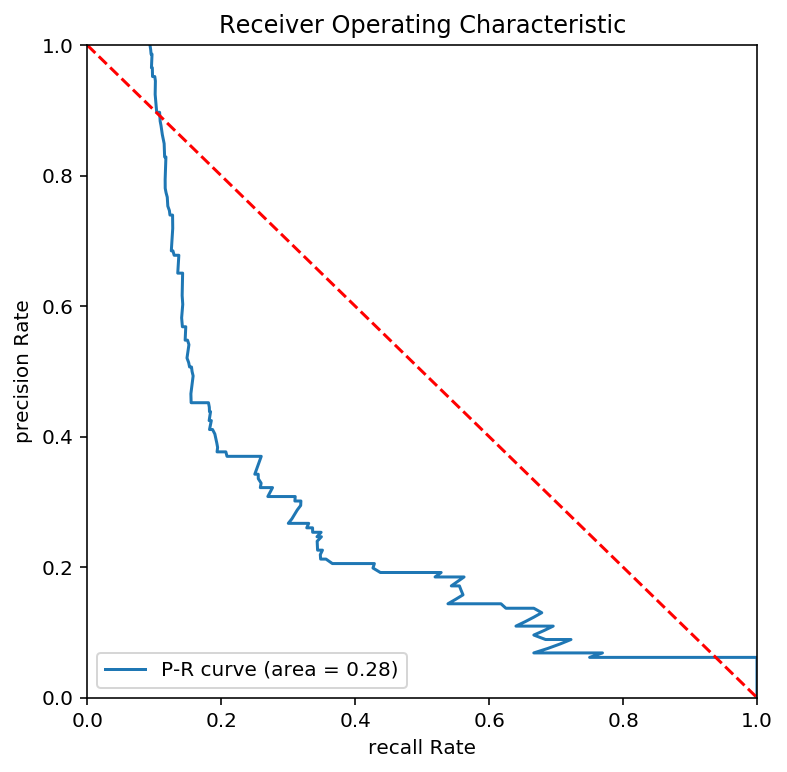

In [292]:
print('\n"""""" RandomForestClassifier """""" (quite slow)')

print('\nSearch for optimal n_estimators in RandomForest, vary 100 to 500, using KFold(5) Cross Validation on train data')
kf = KFold(n_splits=5, random_state=21, shuffle=True)  #produce the k folds
score_list = []
n_list = []
for n in [100, 150, 200, 250, 300, 350, 400, 450, 500]:
    randomforest =  RandomForestClassifier(n_estimators=n,class_weight=weighting,random_state=121)
    cvs = (cross_val_score(randomforest, X_train, y_train, cv=kf, scoring=scoring)).mean()
    score_list.append(cvs)
    n_list.append(n)
    print('{:.0f}->{:.4f}'.format(n, cvs), end=", ")   # display score in 4 decimal place
print('optimal {} score = {:.4f}'.format(scoring,max(score_list)))
optimal_n = int(n_list[score_list.index(max(score_list))])
print('optimal n_estimators = {:.0f}'.format(optimal_n))

time1 = time.time()
randomforest = RandomForestClassifier(n_estimators=optimal_n)
model_report('RandomForestClassifier', randomforest)


In [49]:
# # see how logistic regression confusion matrix varies with threshold
# def make_confusion_matrix(model, threshold=0.5):
#     # Predict class 1 if probability of being in class 1 is greater than threshold
#     # (model.predict(X_test) does this automatically with a threshold of 0.5)
#     y_pred = (logit.predict_proba(X_test)[:, 1] >= threshold)
#     conf = confusion_matrix(y_test, y_pred)
#     plt.figure(figsize = [5,5])
#     sns.heatmap(conf, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
#            xticklabels=['no churn', 'churn'],
#            yticklabels=['no churn', 'churn']);
#     plt.xlabel('prediction')
#     plt.ylabel('actual')
# # Let's see how our confusion matrix changes with changes to the cutoff! 
# from ipywidgets import interactive, FloatSlider
# logit = LogisticRegression(C = optimal_c)
# logit.fit(X_train, y_train)
# interactive(lambda threshold: make_confusion_matrix(logit, threshold), threshold=(0.0,1.0,0.01))